**Multivariate TimeSeries Persistence Classifier**

Combined with:
- State-Of-The-Art model (MLSTM-FCN, etc.)
- Mutual Information (Neural) Estimator

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

import math
import os
import random

import torch
from torch import nn, optim, Tensor
from torch.nn import functional as F
from torch.nn import TransformerEncoder, TransformerEncoderLayer
from torch.utils.data import dataset
from torch.optim.lr_scheduler import _LRScheduler
from torch.utils.data import TensorDataset, DataLoader

import gudhi as gd

import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler

from tqdm import tqdm

# from tsai.all import MLST_FCN, ...

In [3]:
#from utils import *

In [4]:
class TimeSeriesPersistence(torch.nn.Module):
    def __init__(self, max_size):
        super().__init__()
        self.max_size = max_size
        
    def forward(self, ts):        
        # batched pds and persistence vertice indices
        pds = torch.zeros((ts.shape[0], self.max_size, 2))
        idx = torch.zeros((ts.shape[0], self.max_size, 2), dtype=torch.long)
        lens = torch.zeros((ts.shape[0],), dtype=torch.long)
        
        for i in range(ts.shape[0]):        
            # set linear graph corresponding to the time series
            cmplx = create_complex(ts[i])

            # get pairs of critical simplices
            persistence_pairs = get_persistence_pairs(cmplx)

            # get critical time steps corresponding to critical simplices
            persistence_pairs_vertices_idx = get_persistence_pairs_vertices(persistence_pairs)

            # set persistence diagram as the values of time steps at critical time steps
            pd = ts[i][persistence_pairs_vertices_idx]
            
            lens[i] = pd.shape[0]

            # truncate persistence diagram sorted by persistence
            pd = dimensionalize(pd, self.max_size)
            persistence_pairs_vertices_idx = dimensionalize(persistence_pairs_vertices_idx, self.max_size)
            
            pds[i] = pd
            idx[i] = persistence_pairs_vertices_idx
        
        return pds, idx, lens
    
def create_complex(ts):    
    # create a simplicial complex
    cmplx = gd.SimplexTree()
    
    # add simplices
    for (i, v1), (j, v2) in zip(enumerate(ts[:-1]), enumerate(ts[1:], 1)):
        cmplx.insert((i,), v1) # v_i
        cmplx.insert((j,), v2) # v_j
        cmplx.insert((i, j), max(v1, v2)) # e_ij
    
    return cmplx

def get_persistence_pairs(cmplx):    
    # reduce
    cmplx.compute_persistence()

    # get persistence pairs
    persistence_pairs = cmplx.persistence_pairs()
    
    return persistence_pairs
    
def get_persistence_pairs_vertices(persistence_pairs):
    persistence_pairs_vertices_idx = torch.zeros((len(persistence_pairs)-1, 2), dtype=torch.long)

    for i, (sp, sn) in enumerate(persistence_pairs):
        if len(sn)>0:
            vp, vn = sp[0], sn[-1]
            persistence_pairs_vertices_idx[i] = torch.tensor([vp, vn])

    return persistence_pairs_vertices_idx

def dimensionalize(pd, dim):
    persistence_diagram = torch.ones((dim, 2)) * -1
    dim_idx = min(pd.shape[0], dim)
    persistence_diagram[:dim_idx] = pd[:dim_idx]
    return persistence_diagram

class Attention(nn.Module):
    # Single-head attention
    def __init__(self, embed_dim, num_heads, dropout):
        super().__init__()
        attention_dim = embed_dim // num_heads

        self.WQ = nn.Linear(embed_dim, attention_dim, bias=False)
        self.WK = nn.Linear(embed_dim, attention_dim, bias=False)
        self.WV = nn.Linear(embed_dim, attention_dim, bias=False)
        self.dropout = nn.Dropout(dropout)

    def forward(self, query, key, value, mask=None):
        # query, key, value: (batch_size, length, embed_dim)
        # mask: (batch_size, length, length)

        Q = self.WQ(query)
        K = self.WK(key)
        V = self.WV(value)
        # Q, K, V: (batch_size, length, attention_dim)

        norm_factor = math.sqrt(Q.shape[-1])
        dot_products = torch.bmm(Q, K.transpose(1, 2)) / norm_factor
        # dot_products: (batch_size, length, length)

        if mask is not None:
            dot_products = dot_products.masked_fill(mask, -math.inf)

        attention_score = nn.functional.softmax(dot_products, dim=-1)
        attention = torch.bmm(self.dropout(attention_score), V)
        # attention_score: (batch_size, length, length)
        # attention: (batch_size, length, attention_dim)

        return attention, attention_score


class MultiHeadAttention(nn.Module):
    def __init__(self, embed_dim, num_heads, dropout):
        super(MultiHeadAttention, self).__init__()

        assert embed_dim % num_heads == 0
        self.attention_heads = nn.ModuleList([Attention(embed_dim, num_heads, dropout)
                                              for _ in range(num_heads)])

        self.linear = nn.Linear(embed_dim, embed_dim, bias=False)
        self.dropout = nn.Dropout(dropout)

    def forward(self, query, key, value, mask=None):
        # query, key, value: (batch_size, length, embed_dim)
        # mask: (batch_size, length, length)
        attentions, attention_scores = [], []

        for head in self.attention_heads:
            attention, attention_score = head(query, key, value, mask)
            attentions += [attention]
            attention_scores += [attention_score]

        attentions = torch.cat(attentions, dim=-1)
        attention_scores = torch.stack(attention_scores, dim=-1)
        # attentions: (batch_size, length, embed_dim)
        # attention_scores: (batch_size, length, length, num_heads)

        outputs = self.linear(attentions)
        outputs = self.dropout(outputs)
        # outputs: (batch_size, length, embed_dim)

        return outputs, attention_scores

def create_padding_mask(ids, pad_idx=-1):
    # ids: (batch_size, length)
    length = ids.shape[-1]
    padding_mask = (ids == pad_idx)
    padding_mask = padding_mask.unsqueeze(1).repeat(1, length, 1)
    # padding_mask: (batch_size, length, length)

    return padding_mask

class TransformerLayer(nn.Module):
    def __init__(self, embed_dim, fc_dim, num_heads, dropout):
        super().__init__()
        self.self_attention = MultiHeadAttention(embed_dim, num_heads, dropout)
        self.feedforward = nn.Sequential(
            nn.Linear(embed_dim, fc_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(fc_dim, embed_dim),
            nn.Dropout(dropout)
        )
        self.norm1 = nn.LayerNorm(embed_dim)
        self.norm2 = nn.LayerNorm(embed_dim)

    def forward(self, inputs, mask):
        attention, attention_score = self.self_attention(query=inputs, key=inputs, 
                                                         value=inputs, mask=mask)
        outputs = inputs + attention
        outputs = self.norm1(outputs)
        outputs = outputs + self.feedforward(outputs)
        outputs = self.norm2(outputs)
        return outputs, attention_score


class TransformerEncoder(nn.Module):
    def __init__(self, embed_dim, fc_dim, num_heads, dropout, num_layers):
        super().__init__()
        self.transformer_encoder = nn.ModuleList([TransformerLayer(d_model, d_hid, num_heads, dropout) \
                                                 for _ in range(num_layers)])

    def forward(self, X, mask):
        for layer in self.transformer_encoder:
            X, _ = layer(X, mask)
        return X
    
class SimpleConv(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv = nn.Conv1d(1, 1, 3, padding=1)
        
    def forward(self, X):
        batch_size, length = X.shape
        return self.conv(X.reshape(batch_size, 1, length)).reshape(batch_size, length)

class TSPersistenceTokenizer(nn.Module):
    def __init__(self, max_len: int):
        super().__init__()
        self.tsp = TimeSeriesPersistence(max_size=max_len)
        
    def forward(self, X):
        pairs, ids, _ = self.tsp(X)
        return pairs, ids

class TSSequentialTokenizer(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, X):
        batch_size, seq_len = X.shape
        ids = np.arange(seq_len).reshape(seq_len // 2, 2)#[None, :, :].repeat(batch_size, axis=0)
        pairs = torch.tensor(X[:, ids])
        ids = torch.tensor(np.arange(seq_len).reshape(seq_len // 2, 2)[None, :, :].repeat(batch_size, axis=0))
        return pairs, ids

class TSRandomTokenizer(nn.Module):
    def __init__(self):
        super().__init__()
    
    def forward(self, X):
        ids = torch.zeros((batch_size, seq_len // 2, 2), dtype=torch.long)
        pairs = torch.zeros((batch_size, seq_len // 2, 2))
        for i in range(batch_size):
            cid = torch.tensor(np.random.permutation(seq_len).reshape(seq_len // 2, 2))
            pair = torch.tensor(X[i, cid])
            ids[i] = cid
            pairs[i] = pair
        return pairs, ids

# CHECK AND DEBUG
class TSFilledPersistenceTokenizer(nn.Module):
    def __init__(self, max_size: int):
        super().__init__()
        self.tsp = TimeSeriesPersistence(max_size=max_size)
        
    def forward(self, X):
        pairs, ids, lens = self.tsp(X)
        
        for i in range(batch_size):
            not_used = torch.ones(seq_len, dtype=torch.long)
            not_used[ids[i][ids[i] != -1].reshape(-1)] = 0
            pairs[i, lens[i]:] = src[i][not_used == 1].reshape(-1, 2)
            ids[i, lens[i]:] = torch.arange(seq_len)[not_used == 1].reshape(-1, 2)
        
        return pairs, ids

class MaskedMean(nn.Module):
    def __init__(self):
        super().__init__()
        
    def forward(self, X, ids):
        mask = (ids[:, :, 0] != -1).to(torch.float).detach()
        lengths = mask.sum(dim=1).detach()
        return (X * mask.unsqueeze(2)).sum(dim=1) / lengths.unsqueeze(1)

def get_positional_encoding(max_len, d_model):
    position = torch.arange(max_len).unsqueeze(1)
    div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(300.0) / d_model))
    pe = torch.zeros(max_len, d_model)
    pe[:, 0::2] = torch.sin(position * div_term)
    pe[:, 1::2] = torch.cos(position * div_term)
    return pe  # shape (max_len, d_model)


class TSChain(nn.Module):
    def __init__(self, seq_len, d_model, tokenizer, transformer, aggregator, dropout, enable_pos_encoder: bool = True):
        super().__init__()
        self.seq_len = seq_len
        self.d_model = d_model
        
        self.tokenizer = tokenizer
        
        self.feature_map = nn.Linear(2, d_model)
        
        self.enable_pos_encoder = enable_pos_encoder
        if enable_pos_encoder:
            self.global_pos_encoding = get_positional_encoding(seq_len, d_model)
        self.dropout = nn.Dropout(dropout)

        self.transformer = transformer
        self.aggregator = aggregator
    
    def forward(self, X: Tensor) -> Tensor:
        assert X.shape[1] == self.seq_len, f"Wrong length of sequence, real pseq_len={X.shape[1]} (mind that this is seq_len after preprocessing), but in model {self.seq_len}"
        
        pairs, ids = self.tokenizer(X)
        # pairs (batch_size, max_len, 2)
        # ids (batch_size, max_len, 2) unique ints from [0, seq_len)
        # 2 is (0, 1) = (birth, death)
        
        X = self.feature_map(pairs)
        # X (batch_size, max_len, d_model)
        
        P_p, P_m = 0, 0
        if self.enable_pos_encoder:
            P_p = self.global_pos_encoding[ids[:, :, 0]]  # mind padding with -1
            P_m = self.global_pos_encoding[ids[:, :, 1]]
        X = self.dropout(X + P_p + P_m)
        # X (batch_size, max_len, d_model)
        
        padding_mask = create_padding_mask(ids[:, :, 0])
        X = self.transformer(X, padding_mask)
        # X (batch_size, max_len, d_model)
        
        X = self.aggregator(X, ids)
        # X (batch_size, d_model)
        return X
        

class TSPersistenceClassifier(nn.Module):
    def __init__(self, n_classes, preprocessor, chains):
        """
        Parameters:
            n_classes: int -- the number of classes to classify
            preprocessor:
            tokenizer:
            transformers:
            aggregators:
            d_model: int -- the size of inner embedding
            enable_pos_encoder: bool -- enable positional encoding
        """
        super().__init__()
        
        self.preprocessor = preprocessor
        
        self.chains = nn.ModuleList(chains)
        
        self.head = nn.Linear(sum(chain.d_model for chain in chains), n_classes)

    def forward(self, src: Tensor) -> Tensor:
        """
        Arguments:
            src: Tensor, shape ``[batch_size, seq_len]``

        Returns:
            output Tensor of shape ``[batch_size, n_classes]``
        """
        X = self.preprocessor(src)
        # X (batch_size, pseq_len)
        
        X = torch.cat([chain(X) for chain in self.chains], dim=1)
        # chains_i(X) (batch_size, d_model)
        
        output = self.head(X)
        # output (batch_size, n_classes)
        return output

    
class TSPCwLSTM(nn.Module):
    def __init__(self, n_classes, preprocessor, chains, hidden_size=20):
        """
        Parameters:
            n_classes: int -- the number of classes to classify
            preprocessor:
            tokenizer:
            transformers:
            aggregators:
            d_model: int -- the size of inner embedding
            enable_pos_encoder: bool -- enable positional encoding
        """
        super().__init__()
        
        self.preprocessor = preprocessor
        
        self.chains = nn.ModuleList(chains)
        
        self.head = nn.Linear(sum(chain.d_model for chain in chains) + hidden_size, n_classes)
        
        self.lstm = nn.LSTM(input_size=1, hidden_size=hidden_size, batch_first=True)

    def forward(self, src: Tensor) -> Tensor:
        """
        Arguments:
            src: Tensor, shape ``[batch_size, seq_len]``

        Returns:
            output Tensor of shape ``[batch_size, n_classes]``
        """
        X = self.preprocessor(src)
        # X (batch_size, pseq_len)
        
        X = torch.cat([chain(X) for chain in self.chains] + [self.lstm(src[..., None])[0].mean(dim=1)], dim=1)
        # chains_i(X) (batch_size, d_model)
        
        output = self.head(X)
        # output (batch_size, n_classes)
        return output

import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import clear_output


sns.set_style('whitegrid')
plt.rcParams.update({'font.size': 15})


def plot_losses(train_losses, test_losses, train_accuracies, test_accuracies):
    # clear_output()
    fig, axs = plt.subplots(1, 2, figsize=(13, 4))
    axs[0].plot(range(1, len(train_losses) + 1), train_losses, label='train')
    axs[0].plot(range(1, len(test_losses) + 1), test_losses, label='test')
    axs[0].set_ylabel('loss')

    axs[1].plot(range(1, len(train_accuracies) + 1), train_accuracies, label='train')
    axs[1].plot(range(1, len(test_accuracies) + 1), test_accuracies, label='test')
    axs[1].set_ylabel('accuracy')

    for ax in axs:
        ax.set_xlabel('epoch')
        ax.legend()

    plt.show()

def train_model(X_train, y_train, X_test, y_test, model, epochs):
    train_ds = TensorDataset(torch.tensor(X_train).float(), torch.tensor(y_train).long())
    test_ds = TensorDataset(torch.tensor(X_test).float(), torch.tensor(y_test).long())
    train_loader = DataLoader(train_ds, batch_size=20, shuffle=True)
    test_loader = DataLoader(test_ds, batch_size=20, shuffle=False)
    
    lr = 5e-3
    
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    #optimizer = optim.Adam(model.parameters(), lr=lr)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    criterion = nn.CrossEntropyLoss()
    #scheduler = None
    
    train_losses, train_accuracies = [], []
    test_losses, test_accuracies = [], []

    for epoch in tqdm(range(1, epochs + 1)):
        train_loss, train_accuracy = 0.0, 0.0
        model.train()
        for tss, labels in train_loader:
            tss = tss.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            # images: batch_size x num_channels x height x width
            logits = model(tss)
            # logits: batch_size x num_classes
            loss = criterion(logits, labels)
            # print(np.count_nonzero(~np.isnan(logits.detach().numpy())))
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * tss.shape[0]
            train_accuracy += (logits.argmax(dim=1) == labels).sum().item()

        if scheduler is not None:
            scheduler.step()

        train_loss /= len(train_loader.dataset)
        train_accuracy /= len(train_loader.dataset)
        train_losses += [train_loss]
        train_accuracies += [train_accuracy]

        test_loss, test_accuracy = 0.0, 0.0
        model.eval()
        for tss, labels in test_loader:
            tss = tss.to(device)
            labels = labels.to(device)

            with torch.no_grad():
                logits = model(tss)
                # logits: batch_size x num_classes
                loss = criterion(logits, labels)

            test_loss += loss.item() * tss.shape[0]
            test_accuracy += (logits.argmax(dim=1) == labels).sum().item()

        test_loss /= len(test_loader.dataset)
        test_accuracy /= len(test_loader.dataset)
        test_losses += [test_loss]
        test_accuracies += [test_accuracy]
        plot_losses(train_losses, test_losses, train_accuracies, test_accuracies)
    return model, max(test_accuracies), np.array(test_accuracies)

def score(X, y, build_model, train_model, epochs=100, n_repeats=10, n_splits=5):
    accuracy_table = np.zeros((n_repeats, n_splits))
    
    tot_accuracies = np.zeros(epochs)
    
    for i in tqdm(range(n_repeats)):
        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=i)
        for j, (train_idx, test_idx) in enumerate(skf.split(X, y)):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]
            
            seed = i * n_repeats + j
            torch.manual_seed(seed)
            random.seed(seed)
            np.random.seed(seed)

            model = build_model()
            _, accuracy_table[i, j], test_accuracies = train_model(X_train, y_train, X_test, y_test, model, epochs)
            # del model
            tot_accuracies += test_accuracies
    return accuracy_table, tot_accuracies / (n_repeats * n_splits)

def tsai_model_score(X, y, model_name, epochs=100, n_repeats=10, n_splits=5, **model_kwargs):
    print(f"Model parameters: {model_kwargs}")
    accuracy_table = np.zeros((n_repeats, n_splits))
    
    tot_accuracies = np.zeros(epochs)
    
    for i in tqdm(range(n_repeats)):
        skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=i)
        for j, (train_idx, test_idx) in enumerate(skf.split(X, y)):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]
            
            seed = i * n_repeats + j
            torch.manual_seed(seed)
            random.seed(seed)
            np.random.seed(seed)
            
            tfms  = [None, [Categorize()]]
            X, y, splits = combine_split_data([X_train, X_test], [y_train, y_test])
            dsets = TSDatasets(X, y, tfms=tfms, splits=splits, inplace=True)
            dls = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64, 128], batch_tfms=[TSStandardize()], num_workers=0)

            model = model_name(dls.vars, dls.c, **model_kwargs)
            learn = Learner(dls, model, metrics=accuracy)
            learn.lr_find()
            learn.fit_one_cycle(epochs)
            
            # del model
            test_accuracies = np.array(learn.recorder.values)[:, 2]

            accuracy_table[i, j] = np.max(test_accuracies)
            tot_accuracies += test_accuracies
    return accuracy_table, tot_accuracies / (n_repeats * n_splits)

**Model**

In [5]:
class MSimpleConv(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.conv = nn.Conv1d(dim, dim, 3, padding=1)
        
    def forward(self, X):
        return self.conv(X)

In [6]:
class MTSChain(nn.Module):
    def __init__(self, dim, seq_len, d_model, tokenizer, transformer, aggregator, dropout, enable_pos_encoder: bool = True):
        super().__init__()
        self.dim = dim
        self.seq_len = seq_len
        self.d_model = d_model
        
        self.tokenizer = tokenizer
        
        self.feature_map = nn.Linear(2 + dim, d_model)
        
        self.enable_pos_encoder = enable_pos_encoder
        if enable_pos_encoder:
            self.global_pos_encoding = get_positional_encoding(seq_len, d_model)
        self.dropout = nn.Dropout(dropout)

        self.transformer = transformer
        self.aggregator = aggregator
    
    def forward(self, X: Tensor) -> Tensor:
        assert X.shape[1] == self.dim, f"Wrong dim of sequence, real pdim={X.shape[1]} (mind that this is dim after preprocessing), but in model {self.dim}"
        assert X.shape[2] == self.seq_len, f"Wrong length of sequence, real pseq_len={X.shape[2]} (mind that this is seq_len after preprocessing), but in model {self.seq_len}"
        
        pairs_array, ids_array = zip(*[self.tokenizer(X[:, i]) for i in range(dim)])
        channel_ids = torch.cat([torch.full((obj.shape[1],), i) for i, obj in enumerate(pairs_array)])
        # channel_ids (max_len)
        channel_ohe = nn.functional.one_hot(channel_ids, num_classes=dim)
        # channel_ohe (max_len, dim)
        pairs = torch.cat(pairs_array, dim=1)
        ids = torch.cat(ids_array, dim=1)
        # pairs (batch_size, max_len, 2)
        # ids (batch_size, max_len, 2) unique ints from [0, seq_len)
        # 2 is (0, 1) = (birth, death)
        
        pairs = torch.cat((pairs, channel_ohe.unsqueeze(0).repeat(X.shape[0], 1, 1)), dim=2)
        # pairs (batch_size, max_len, 2 + dim)
        
        X = self.feature_map(pairs)
        # X (batch_size, max_len, d_model)
        
        P_p, P_m = 0, 0
        if self.enable_pos_encoder:
            P_p = self.global_pos_encoding[ids[:, :, 0]]  # mind padding with -1
            P_m = self.global_pos_encoding[ids[:, :, 1]]
        X = self.dropout(X + P_p + P_m)
        # X (batch_size, max_len, d_model)
        
        padding_mask = create_padding_mask(ids[:, :, 0])
        X = self.transformer(X, padding_mask)
        # X (batch_size, max_len, d_model)
        
        X = self.aggregator(X, ids)
        # X (batch_size, d_model)
        return X

**MTesting**

In [7]:
np.random.seed(0)
rids = np.random.choice(956, size=50, replace=False)

In [8]:
T_raw = np.load("T_subjects_1,5_nsd_vs_rest.npy")[:, 1]
y = np.load("y_subjects_1,5_nsd_vs_rest.npy")[1]
T_raw.shape, y.shape

((956, 226, 116), (956,))

In [9]:
T_raw = T_raw[rids]
y = y[rids]
y

array([1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0])

In [10]:
# default mode network (DMN), default network, default state network, medial frontoparietal network (M-FPN)
dmn = [22, 23, 34, 35, 36, 37, 38, 39, 64, 65, 66, 67]
brain_network = dmn

In [11]:
T_bn = np.transpose(T_raw, axes=(0, 2, 1))[:, brain_network]
T_bn.shape

(50, 12, 226)

  0%|                                                                                                                                                                                      | 0/100 [00:00<?, ?it/s]

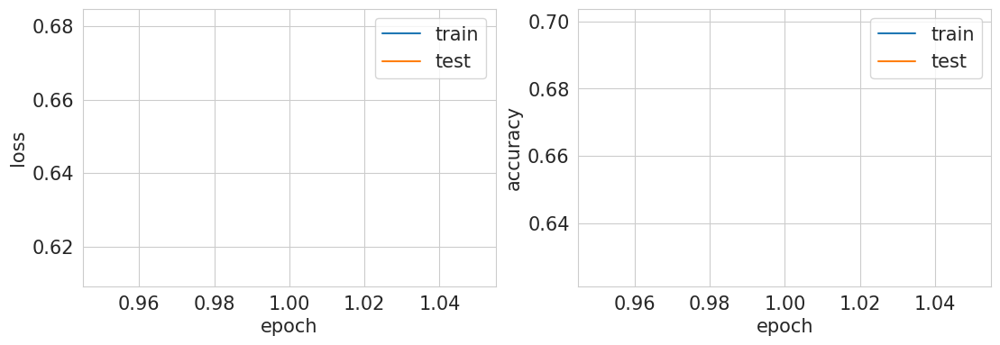


  1%|█▋                                                                                                                                                                            | 1/100 [00:27<45:33, 27.62s/it]

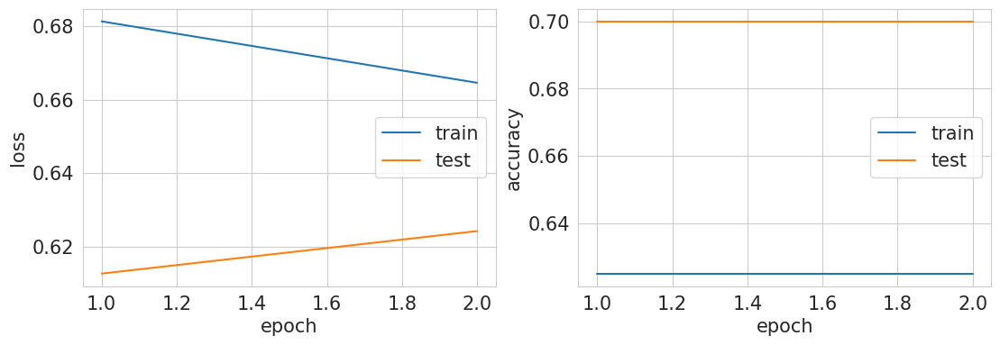


  2%|███▍                                                                                                                                                                          | 2/100 [00:54<44:06, 27.01s/it]

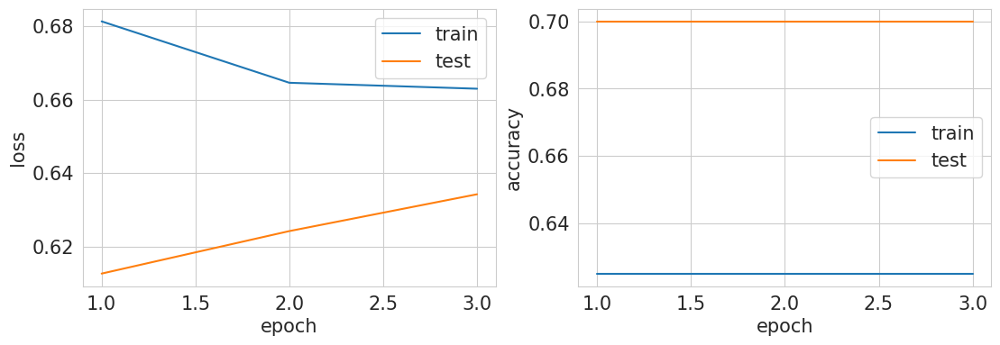


  3%|█████▏                                                                                                                                                                        | 3/100 [01:19<42:25, 26.25s/it]

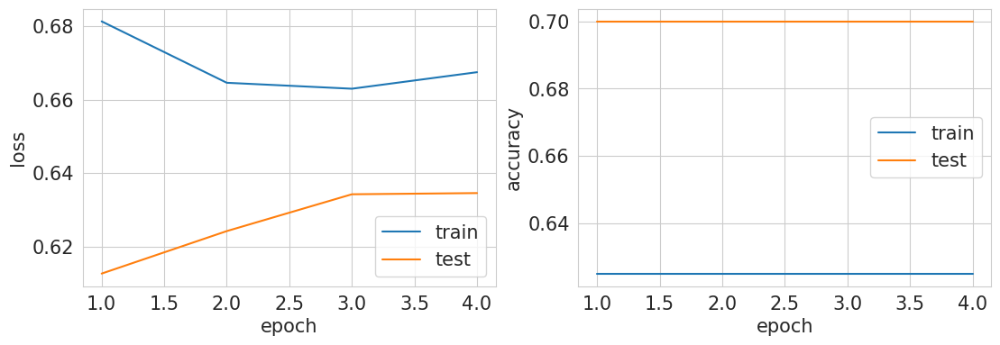


  4%|██████▉                                                                                                                                                                       | 4/100 [01:44<41:03, 25.66s/it]

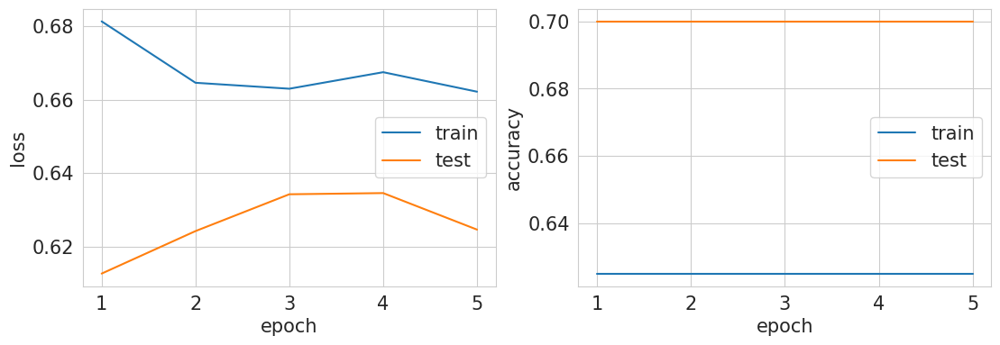


  5%|████████▋                                                                                                                                                                     | 5/100 [02:10<40:44, 25.73s/it]

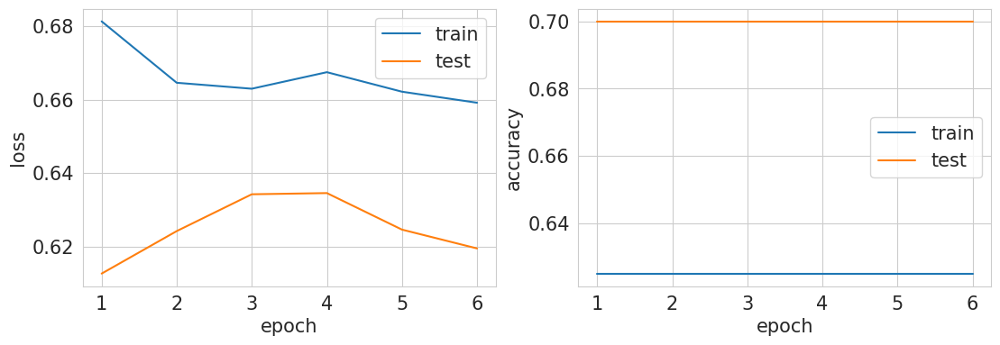


  6%|██████████▍                                                                                                                                                                   | 6/100 [02:36<40:53, 26.10s/it]

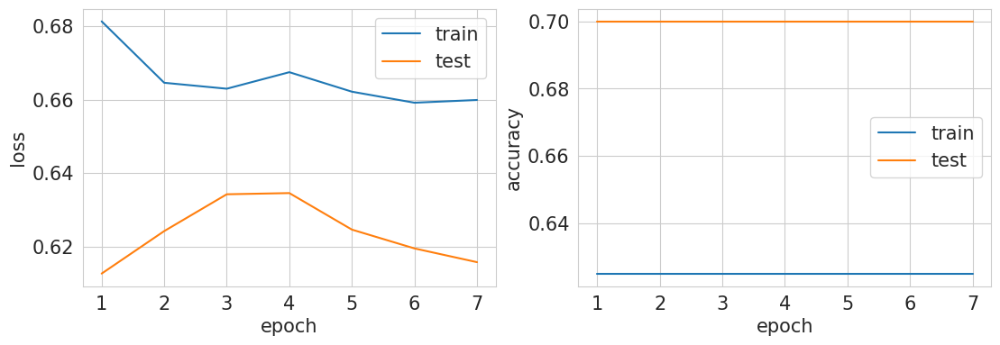


  7%|████████████▏                                                                                                                                                                 | 7/100 [03:01<39:50, 25.70s/it]

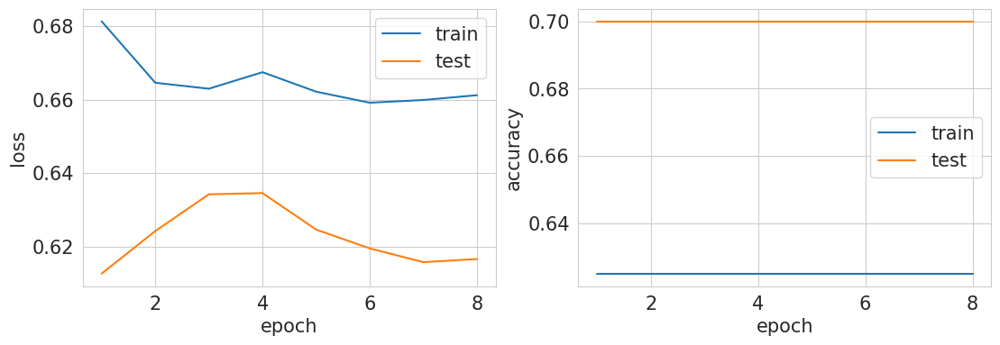


  8%|█████████████▉                                                                                                                                                                | 8/100 [03:26<39:05, 25.49s/it]

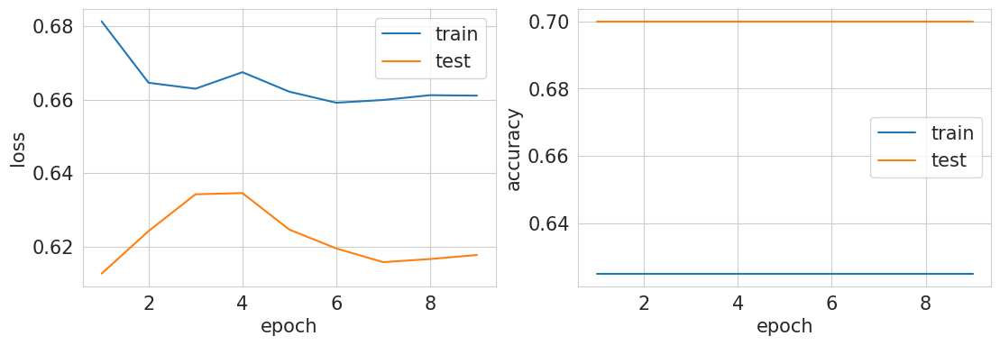


  0%|                                                                                                                                                                                        | 0/2 [04:02<?, ?it/s]


KeyboardInterrupt: 

In [12]:
n_classes = 2
dim = 12
pdim = 12  # after preprocessor
seq_len = 226
pseq_len = seq_len  # after preprocessor
max_len = pseq_len // 2
d_model = 16#32
num_heads = 2
d_hid = 16 #64
nlayers = 2
dropout = 0.2

ret = score(T_bn, y,
            lambda: TSPersistenceClassifier(n_classes=2, preprocessor=MSimpleConv(dim),
                                            chains=[MTSChain(pdim, pseq_len,
                                                            d_model,
                                                            tokenizer=TSPersistenceTokenizer(max_len),
                                                            transformer=TransformerEncoder(d_model, d_hid, num_heads, dropout, nlayers),
                                                            aggregator=MaskedMean(),
                                                            dropout=dropout,
                                                            enable_pos_encoder=True)]),
            train_model, n_repeats=2, n_splits=5)

**Testing**

In [18]:
from tsai.all import get_classification_data
X, y, splits = get_classification_data('ECG200', split_data=False)
X = X.reshape(200, 96)
y = np.array(list(map(int, y)))
y[y == -1] = 0

  0%|                                                                                                                                                                                      | 0/100 [00:00<?, ?it/s]

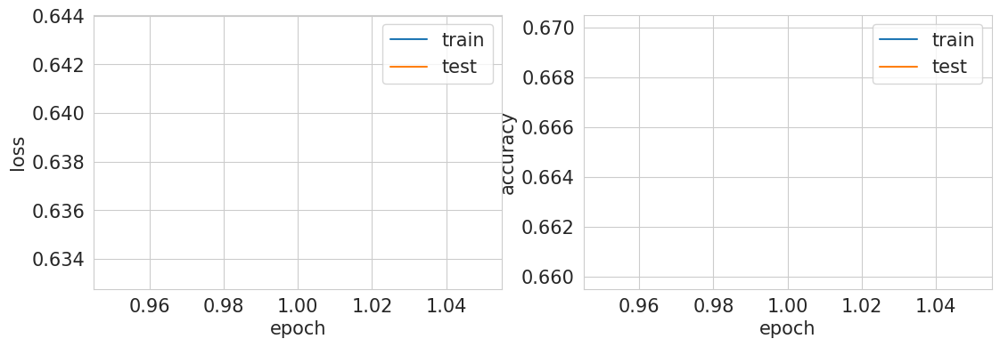


  1%|█▋                                                                                                                                                                            | 1/100 [00:01<01:41,  1.02s/it]

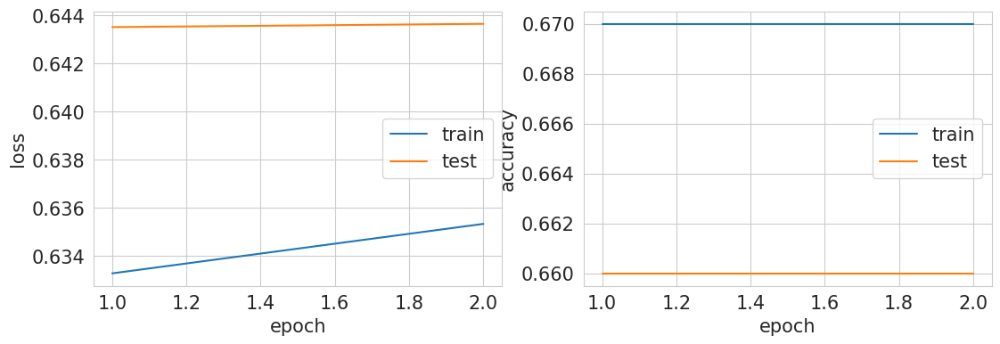


  2%|███▍                                                                                                                                                                          | 2/100 [00:01<01:36,  1.01it/s]

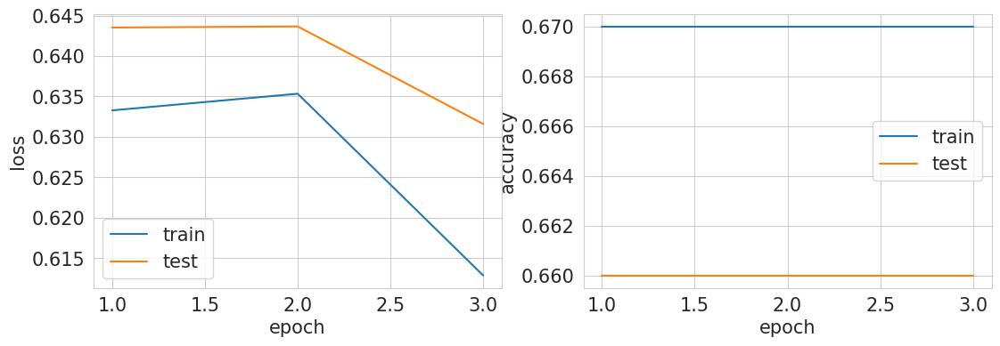


  3%|█████▏                                                                                                                                                                        | 3/100 [00:02<01:31,  1.05it/s]

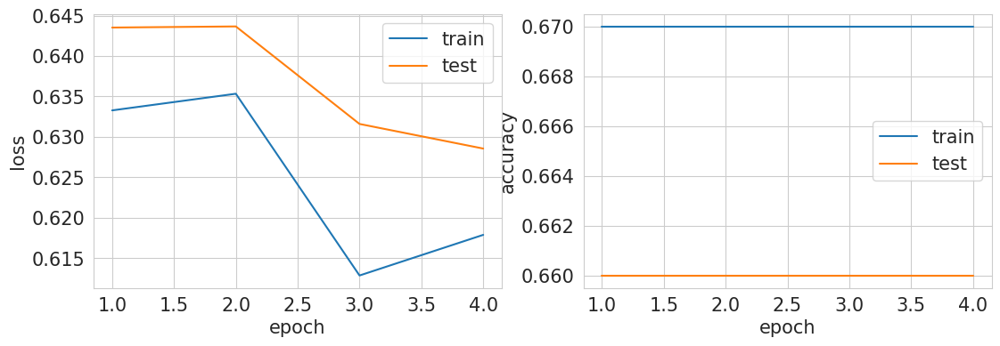


  4%|██████▉                                                                                                                                                                       | 4/100 [00:03<01:31,  1.05it/s]

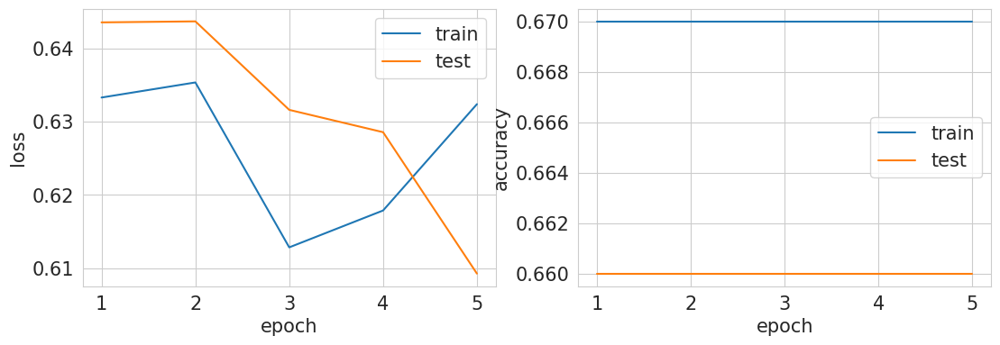


  5%|████████▋                                                                                                                                                                     | 5/100 [00:04<01:32,  1.02it/s]

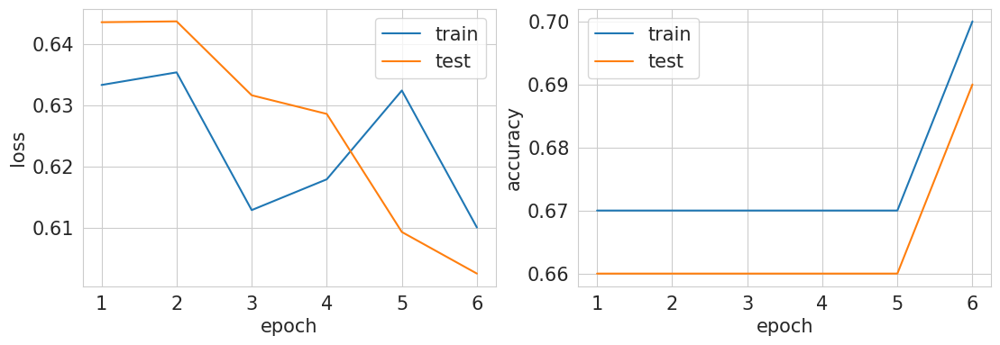


  6%|██████████▍                                                                                                                                                                   | 6/100 [00:05<01:28,  1.06it/s]

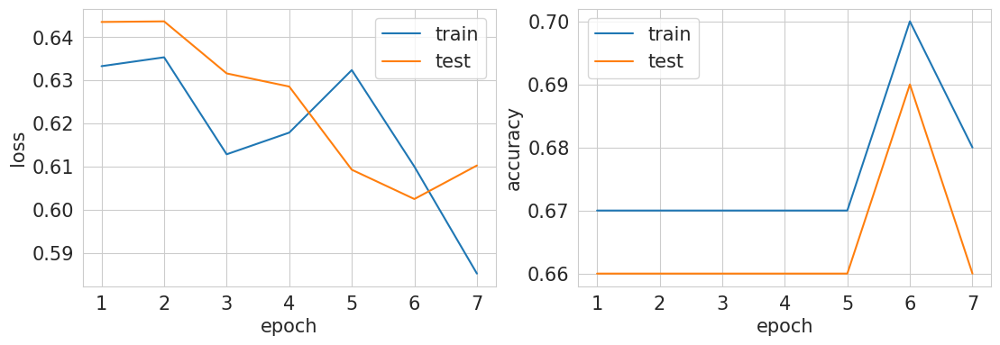


  7%|████████████▏                                                                                                                                                                 | 7/100 [00:06<01:28,  1.05it/s]

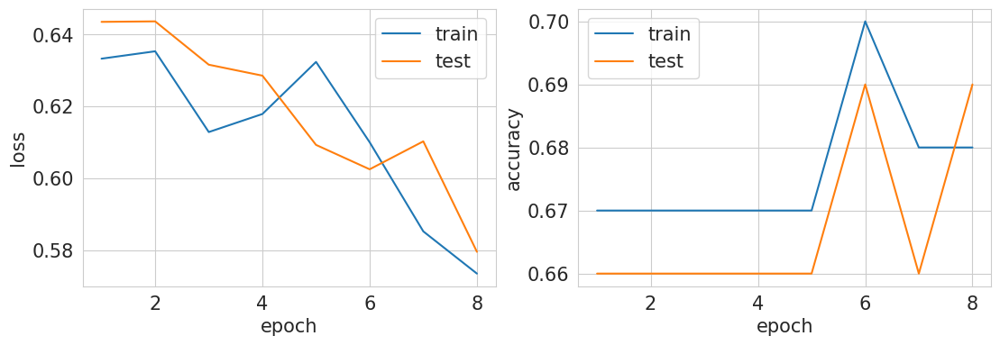


  8%|█████████████▉                                                                                                                                                                | 8/100 [00:07<01:26,  1.06it/s]

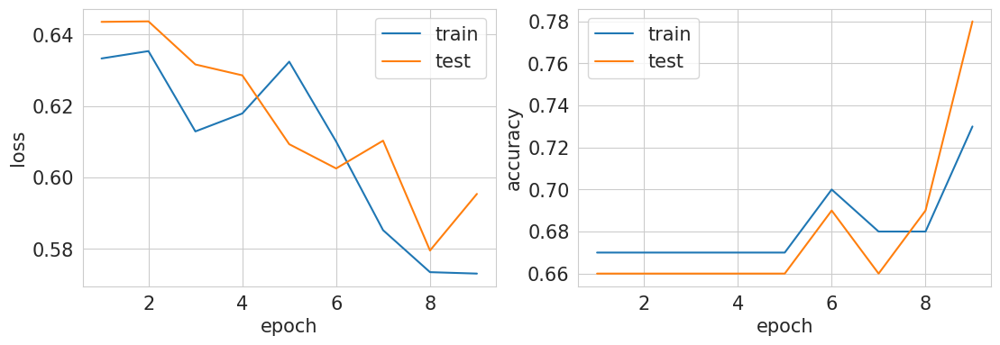


  9%|███████████████▋                                                                                                                                                              | 9/100 [00:08<01:23,  1.09it/s]

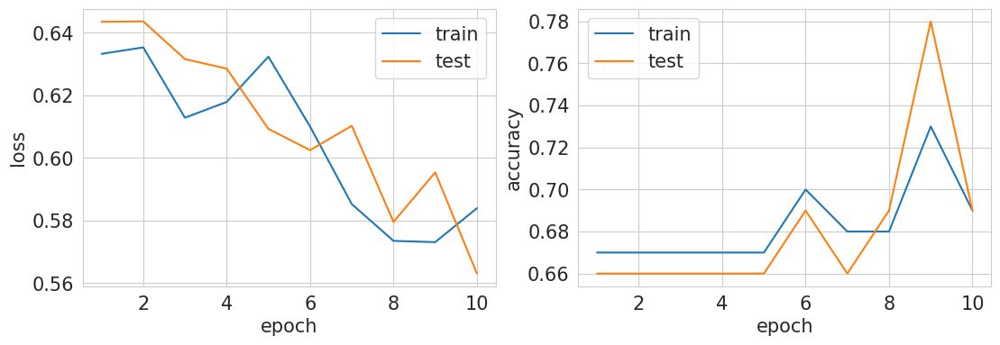


 10%|█████████████████▎                                                                                                                                                           | 10/100 [00:09<01:21,  1.10it/s]

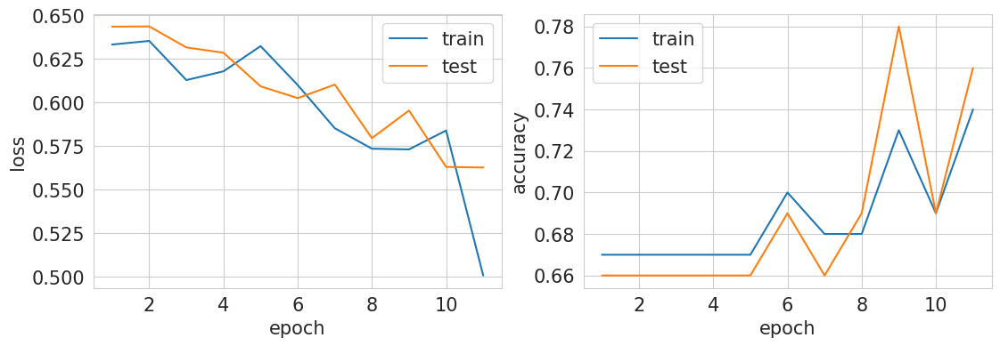


 11%|███████████████████                                                                                                                                                          | 11/100 [00:10<01:27,  1.02it/s]

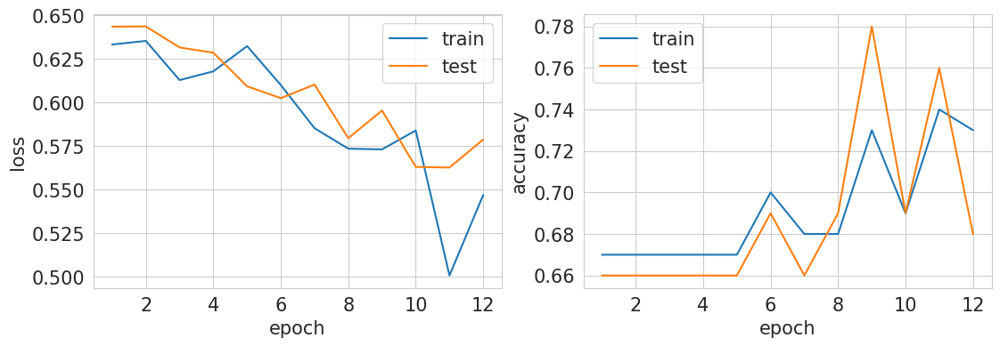


 12%|████████████████████▊                                                                                                                                                        | 12/100 [00:11<01:27,  1.00it/s]

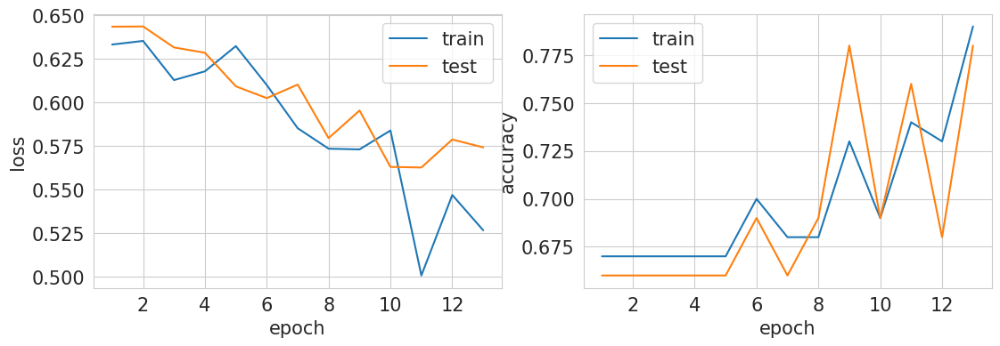


 13%|██████████████████████▍                                                                                                                                                      | 13/100 [00:12<01:25,  1.02it/s]

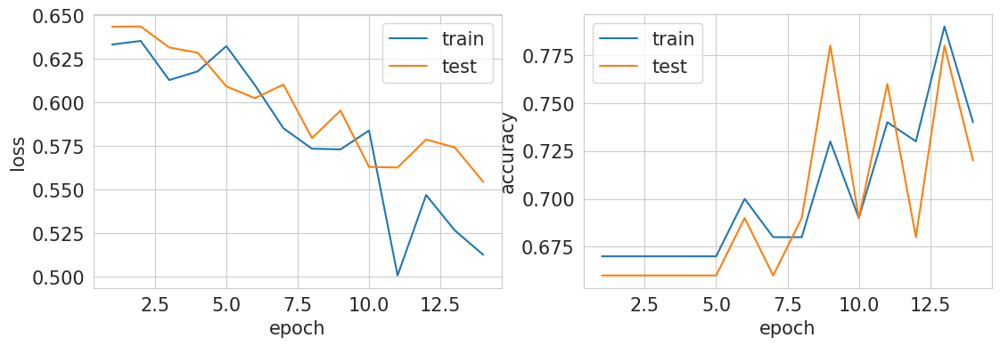


 14%|████████████████████████▏                                                                                                                                                    | 14/100 [00:13<01:22,  1.05it/s]

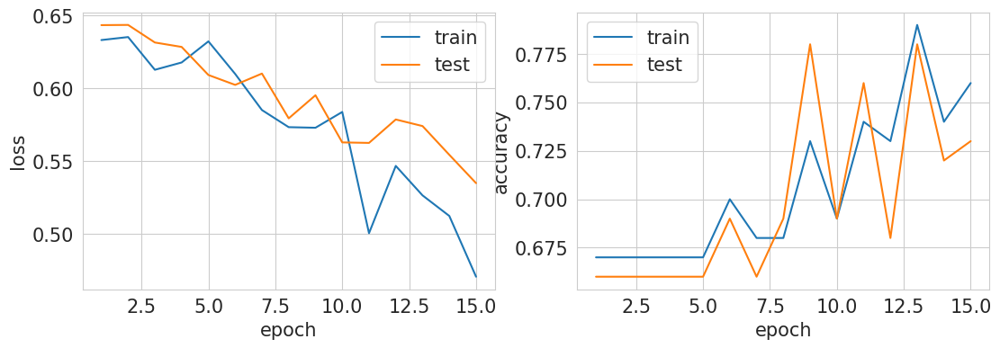


 15%|█████████████████████████▉                                                                                                                                                   | 15/100 [00:14<01:20,  1.06it/s]

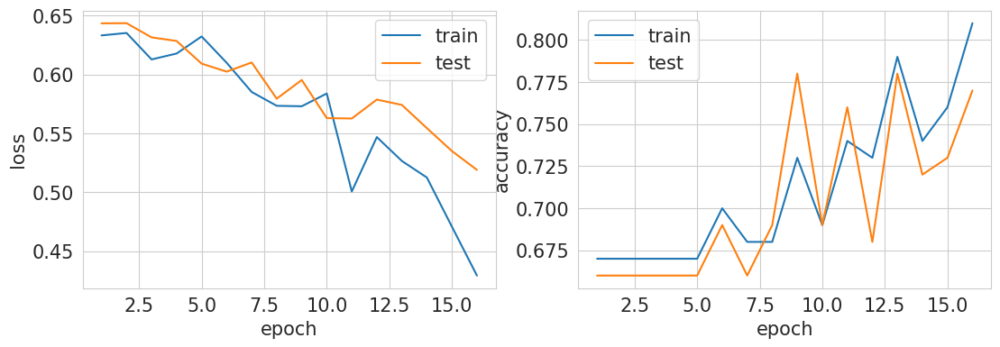


 16%|███████████████████████████▋                                                                                                                                                 | 16/100 [00:15<01:18,  1.07it/s]

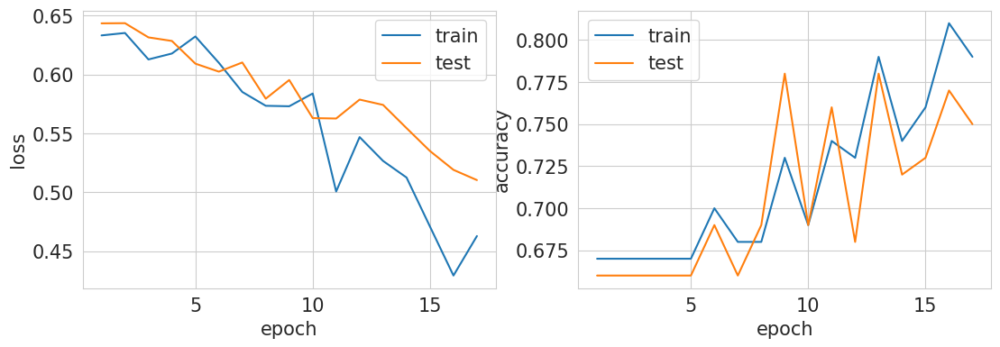


 17%|█████████████████████████████▍                                                                                                                                               | 17/100 [00:16<01:17,  1.08it/s]

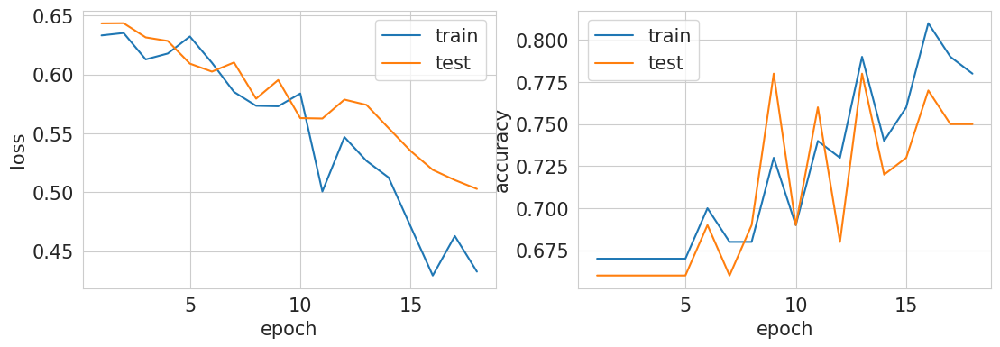


 18%|███████████████████████████████▏                                                                                                                                             | 18/100 [00:17<01:19,  1.03it/s]

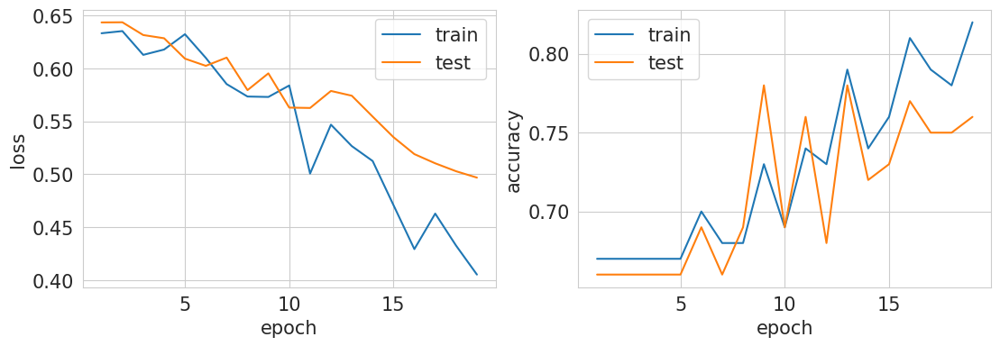


 19%|████████████████████████████████▊                                                                                                                                            | 19/100 [00:18<01:19,  1.02it/s]

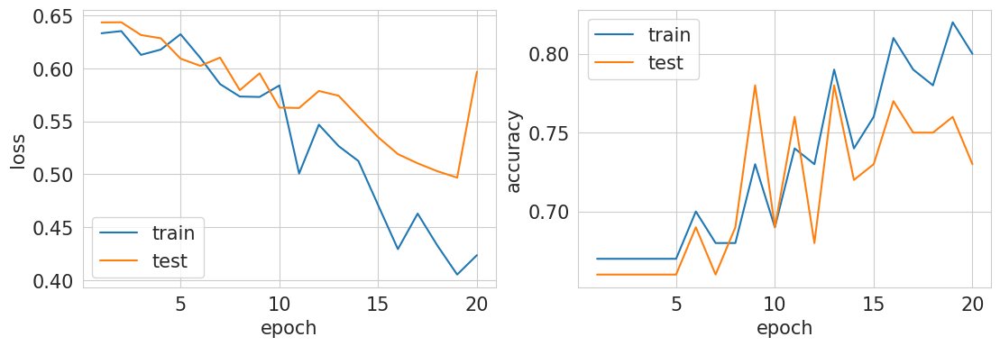


 20%|██████████████████████████████████▌                                                                                                                                          | 20/100 [00:19<01:18,  1.02it/s]

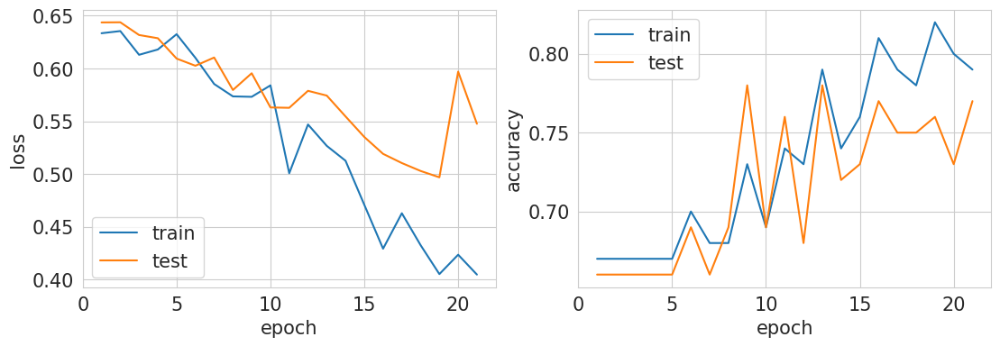


 21%|████████████████████████████████████▎                                                                                                                                        | 21/100 [00:20<01:15,  1.04it/s]

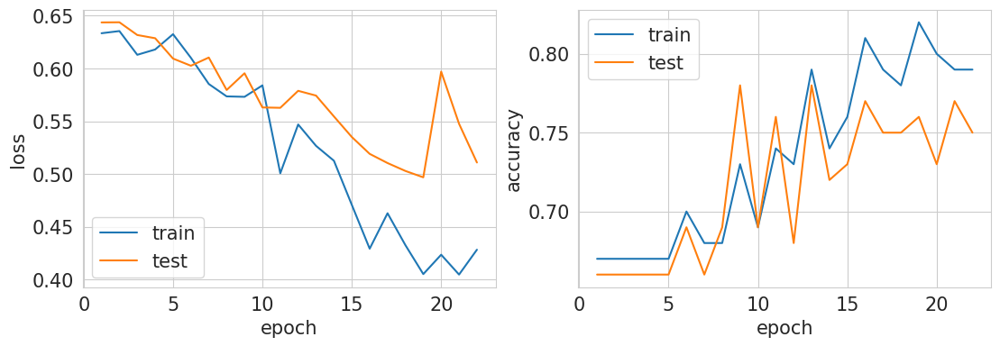


 22%|██████████████████████████████████████                                                                                                                                       | 22/100 [00:21<01:14,  1.05it/s]

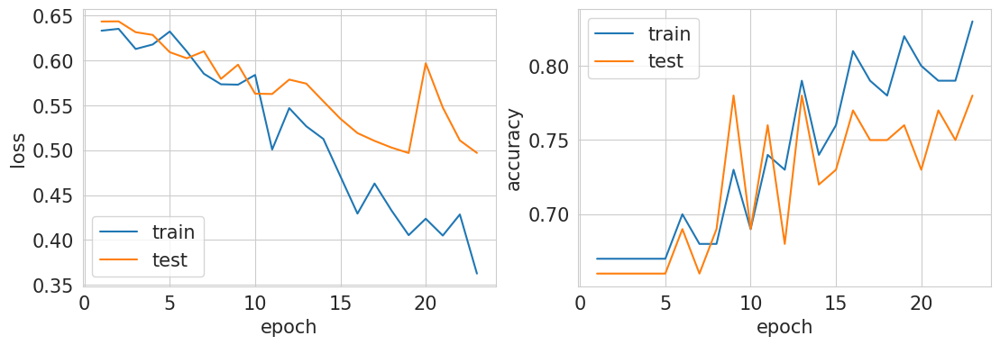


 23%|███████████████████████████████████████▊                                                                                                                                     | 23/100 [00:22<01:15,  1.02it/s]

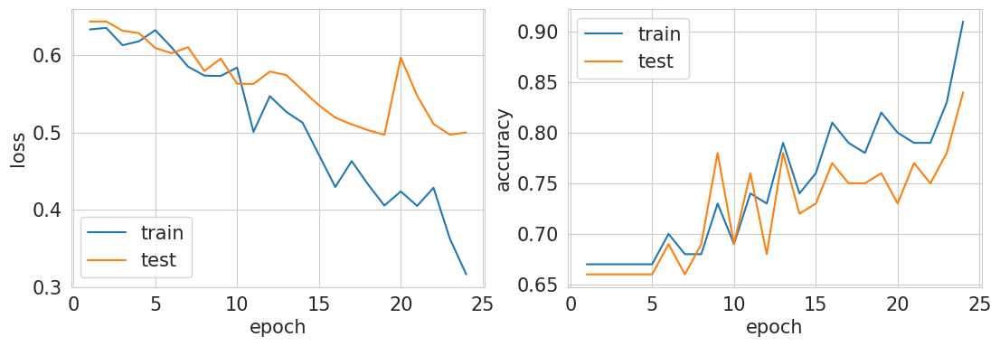


 24%|█████████████████████████████████████████▌                                                                                                                                   | 24/100 [00:23<01:14,  1.02it/s]

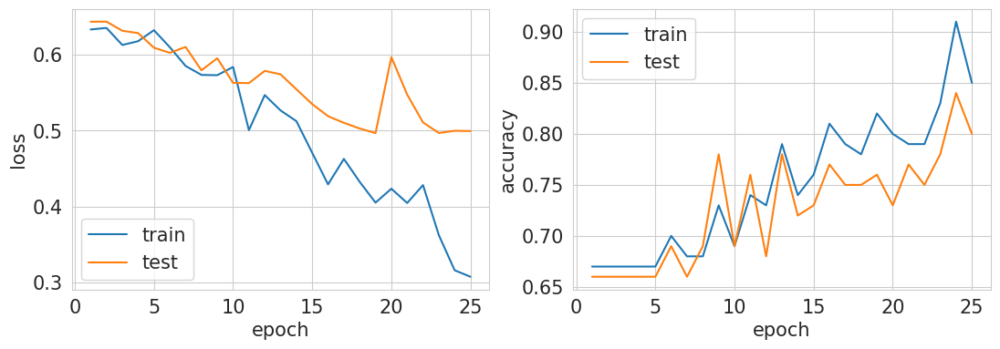


 25%|███████████████████████████████████████████▎                                                                                                                                 | 25/100 [00:23<01:11,  1.05it/s]

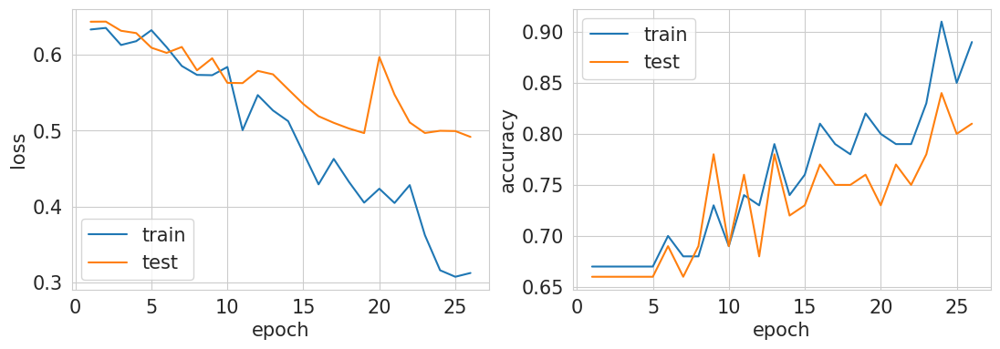


 26%|████████████████████████████████████████████▉                                                                                                                                | 26/100 [00:24<01:10,  1.06it/s]

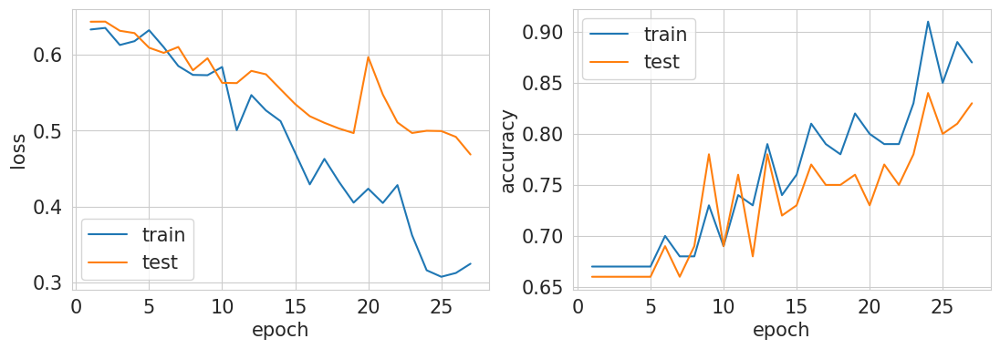


 27%|██████████████████████████████████████████████▋                                                                                                                              | 27/100 [00:25<01:09,  1.05it/s]

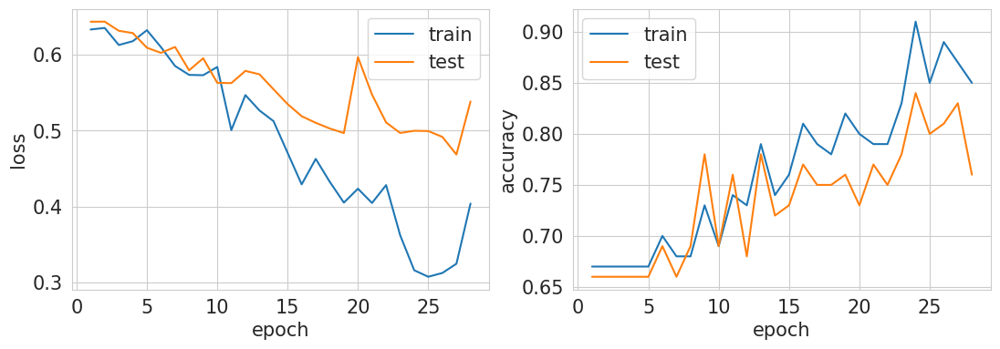


 28%|████████████████████████████████████████████████▍                                                                                                                            | 28/100 [00:26<01:09,  1.04it/s]

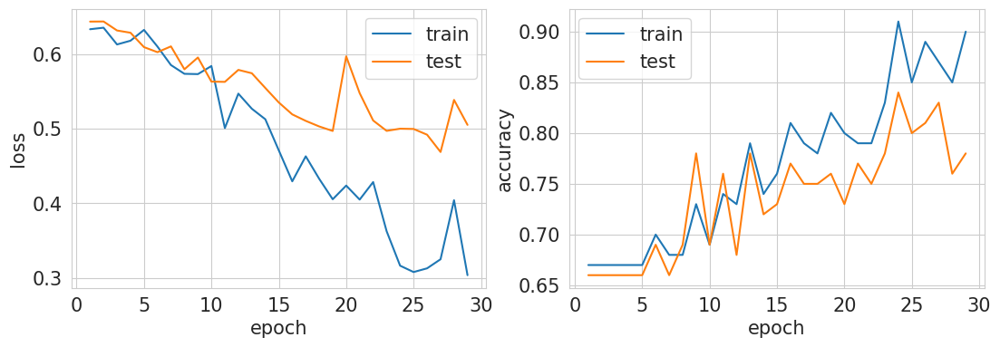


 29%|██████████████████████████████████████████████████▏                                                                                                                          | 29/100 [00:27<01:09,  1.02it/s]

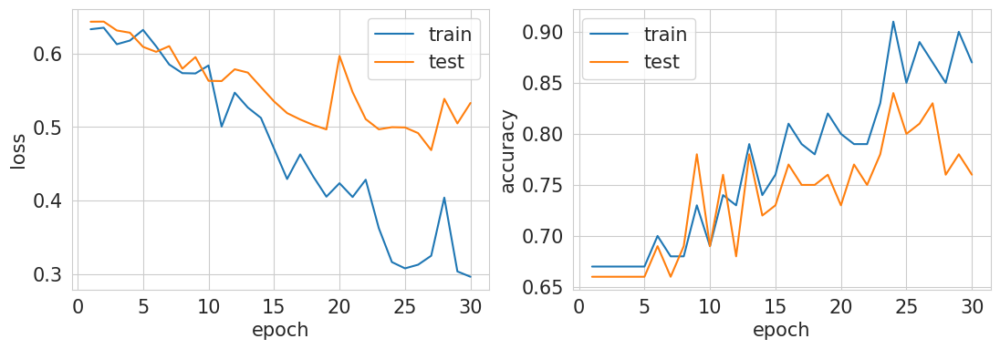


 30%|███████████████████████████████████████████████████▉                                                                                                                         | 30/100 [00:29<01:11,  1.03s/it]

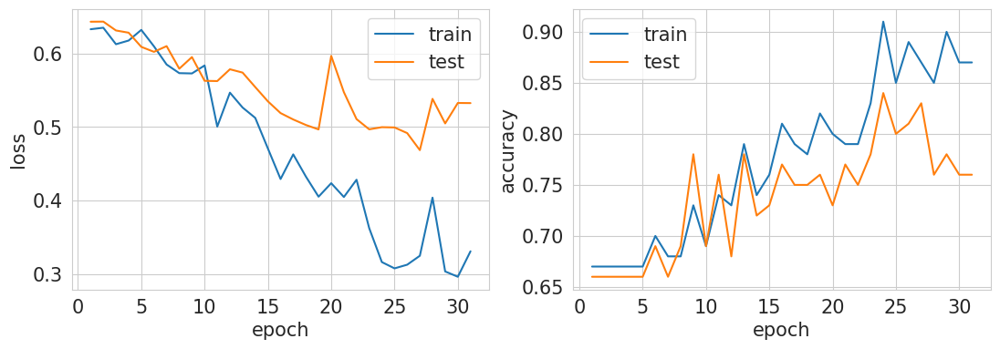


 31%|█████████████████████████████████████████████████████▋                                                                                                                       | 31/100 [00:29<01:09,  1.01s/it]

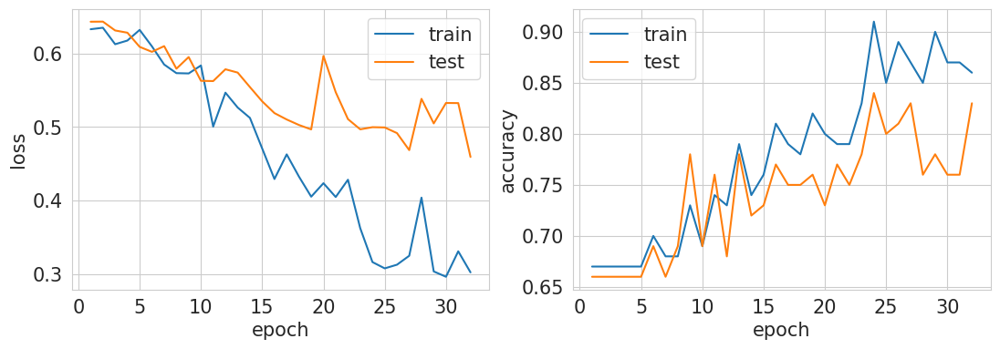


 32%|███████████████████████████████████████████████████████▎                                                                                                                     | 32/100 [00:31<01:11,  1.06s/it]

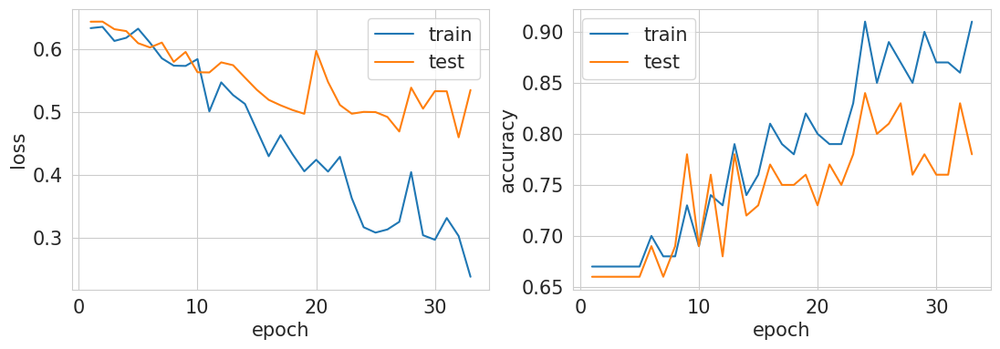


 33%|█████████████████████████████████████████████████████████                                                                                                                    | 33/100 [00:32<01:06,  1.00it/s]

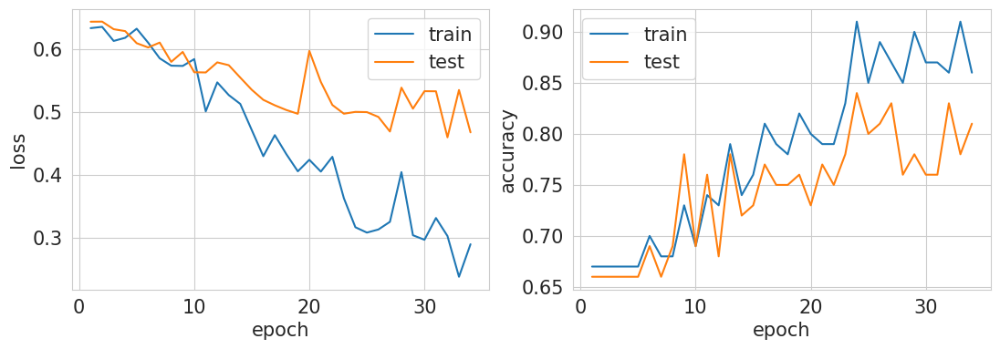


 34%|██████████████████████████████████████████████████████████▊                                                                                                                  | 34/100 [00:32<01:03,  1.04it/s]

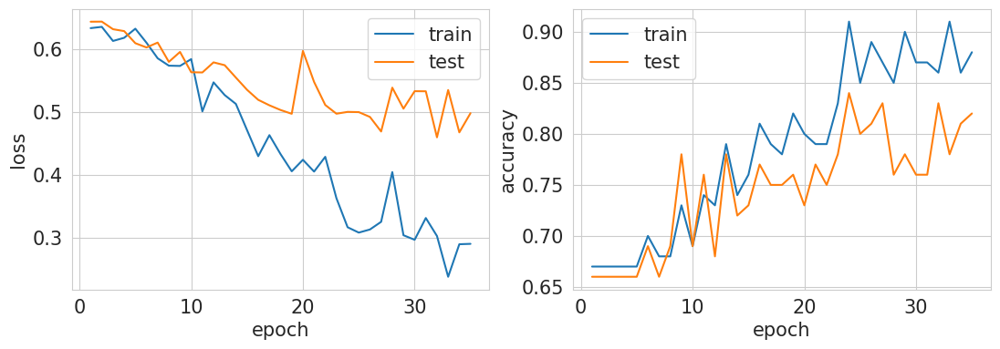


 35%|████████████████████████████████████████████████████████████▌                                                                                                                | 35/100 [00:33<01:00,  1.08it/s]

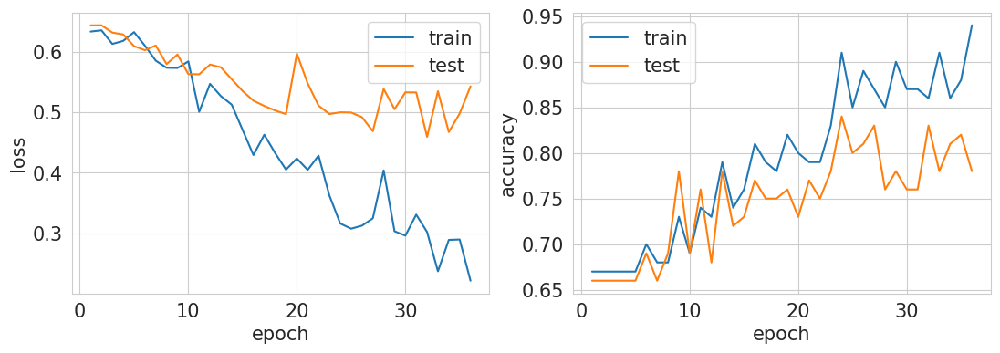


 36%|██████████████████████████████████████████████████████████████▎                                                                                                              | 36/100 [00:34<00:58,  1.10it/s]

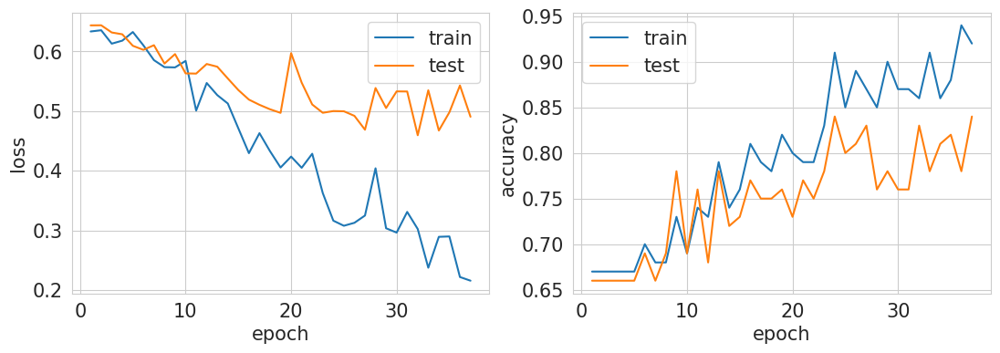


 37%|████████████████████████████████████████████████████████████████                                                                                                             | 37/100 [00:35<00:57,  1.09it/s]

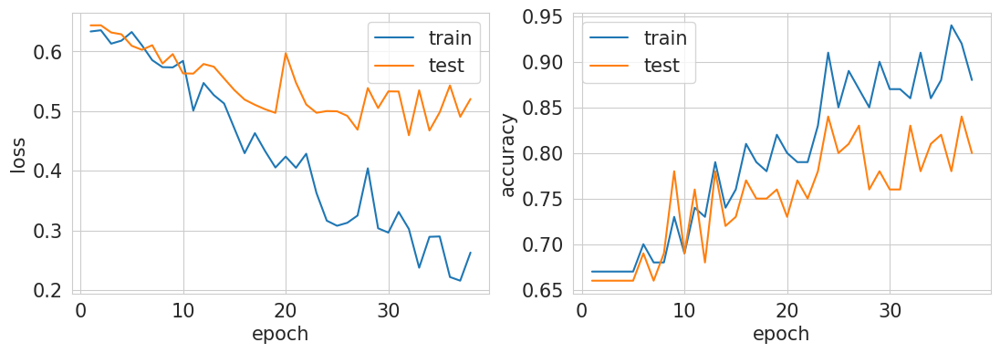


 38%|█████████████████████████████████████████████████████████████████▋                                                                                                           | 38/100 [00:36<00:55,  1.11it/s]

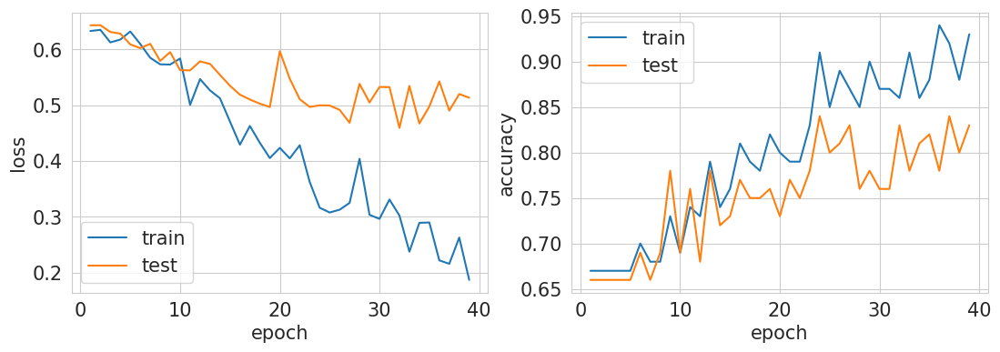


 39%|███████████████████████████████████████████████████████████████████▍                                                                                                         | 39/100 [00:37<00:54,  1.12it/s]

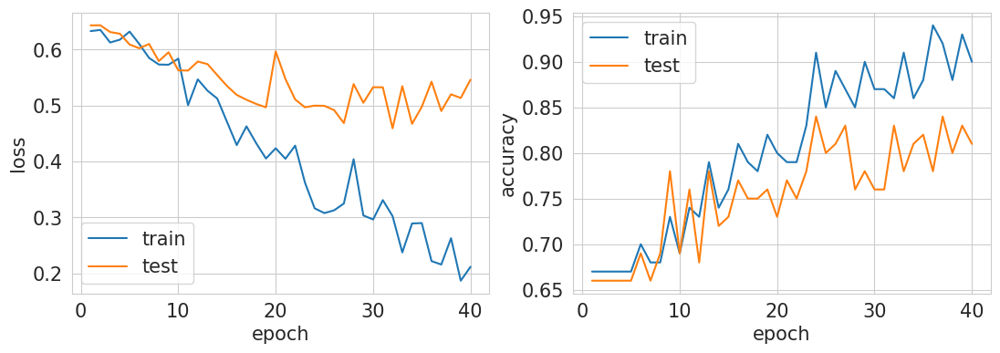


 40%|█████████████████████████████████████████████████████████████████████▏                                                                                                       | 40/100 [00:38<00:52,  1.14it/s]

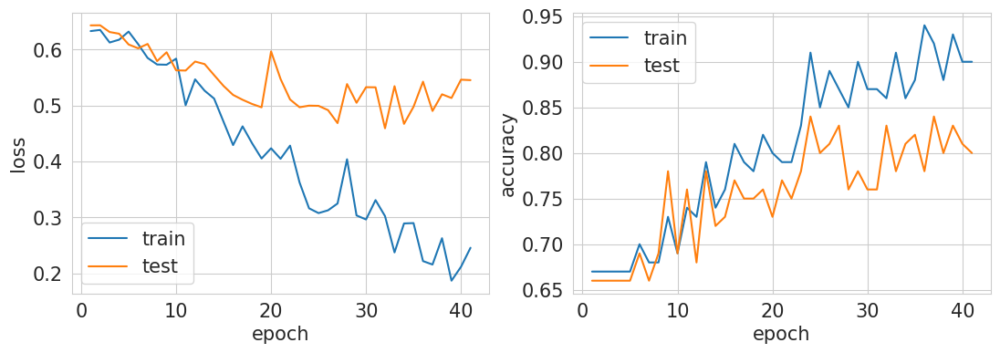


 41%|██████████████████████████████████████████████████████████████████████▉                                                                                                      | 41/100 [00:38<00:51,  1.15it/s]

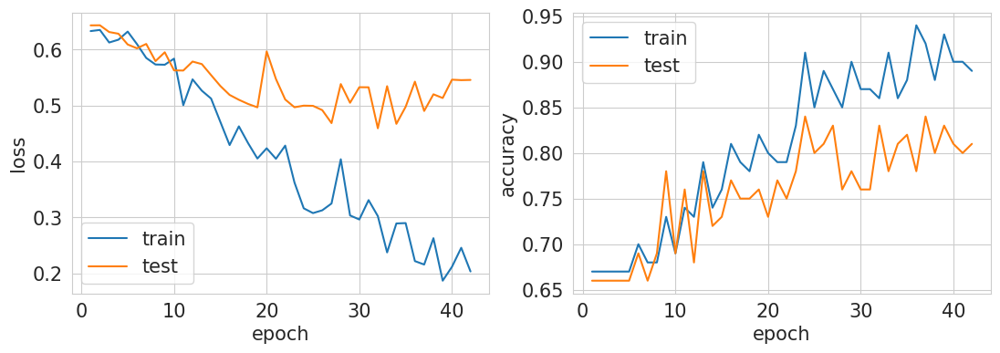


 42%|████████████████████████████████████████████████████████████████████████▋                                                                                                    | 42/100 [00:39<00:50,  1.15it/s]

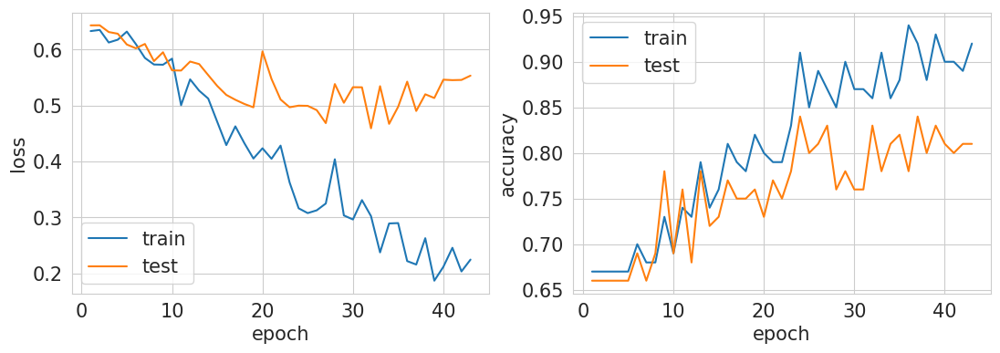


 43%|██████████████████████████████████████████████████████████████████████████▍                                                                                                  | 43/100 [00:40<00:50,  1.13it/s]

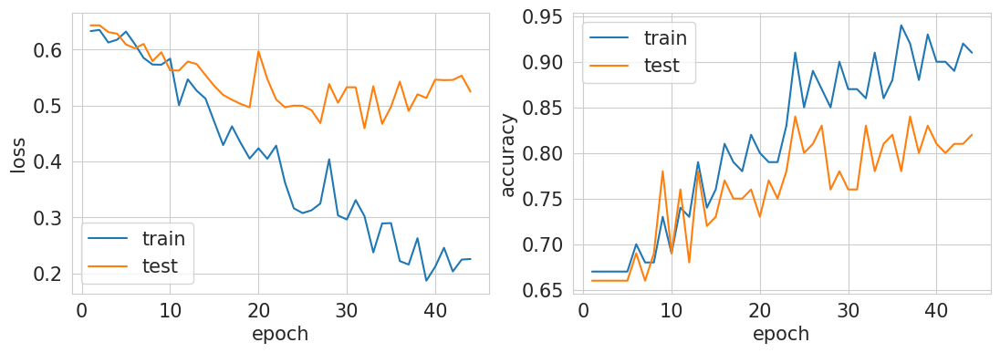


 44%|████████████████████████████████████████████████████████████████████████████                                                                                                 | 44/100 [00:41<00:49,  1.13it/s]

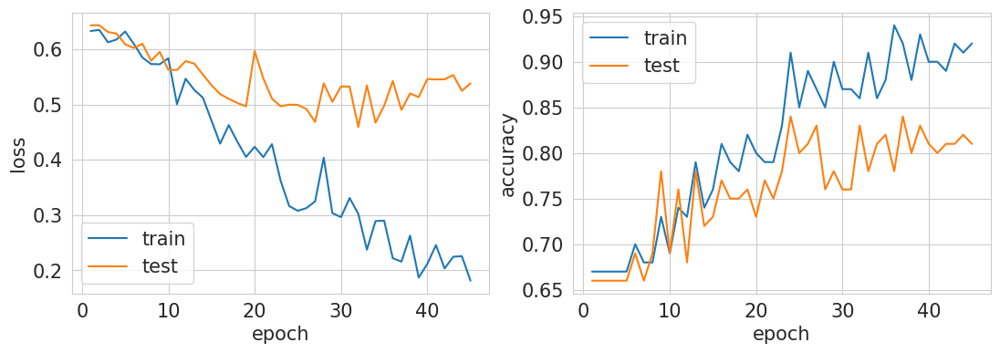


 45%|█████████████████████████████████████████████████████████████████████████████▊                                                                                               | 45/100 [00:42<00:48,  1.14it/s]

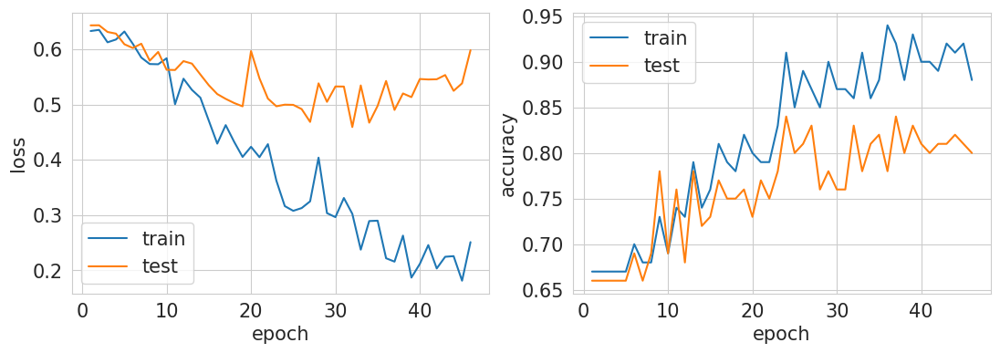


 46%|███████████████████████████████████████████████████████████████████████████████▌                                                                                             | 46/100 [00:43<00:50,  1.06it/s]

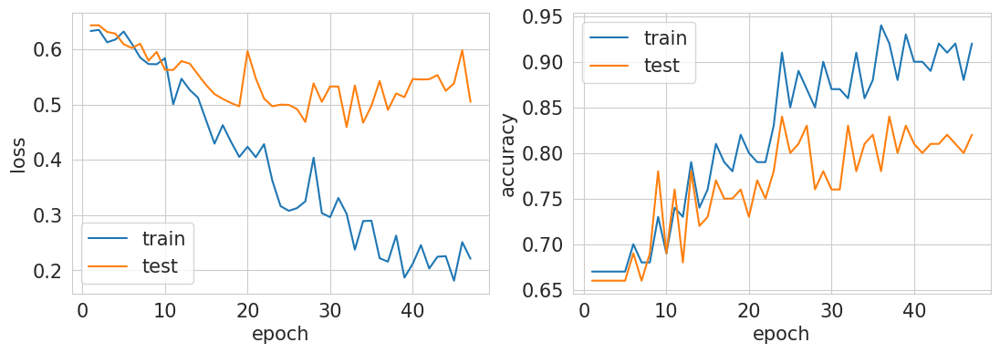


 47%|█████████████████████████████████████████████████████████████████████████████████▎                                                                                           | 47/100 [00:44<00:49,  1.08it/s]

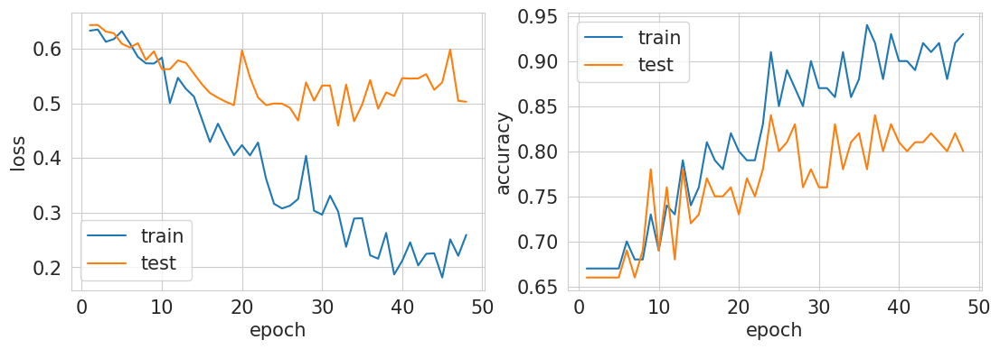


 48%|███████████████████████████████████████████████████████████████████████████████████                                                                                          | 48/100 [00:45<00:47,  1.09it/s]

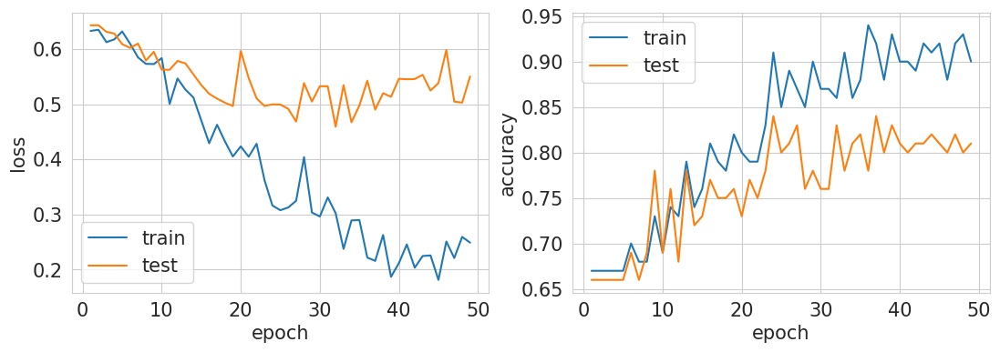


 49%|████████████████████████████████████████████████████████████████████████████████████▊                                                                                        | 49/100 [00:46<00:46,  1.11it/s]

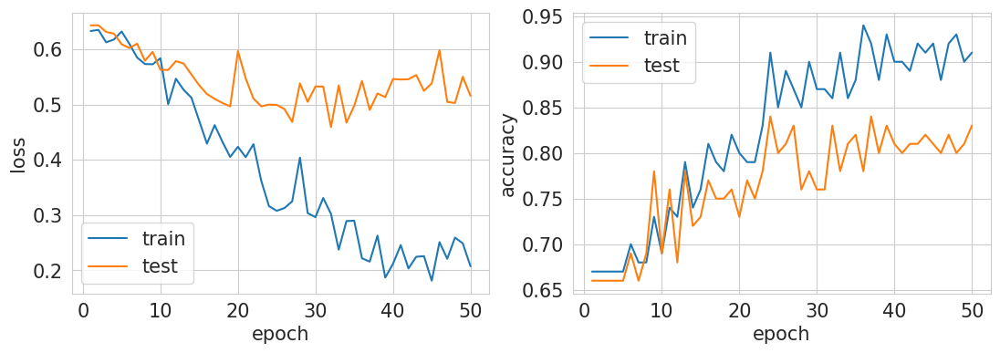


 50%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 50/100 [00:47<00:45,  1.10it/s]

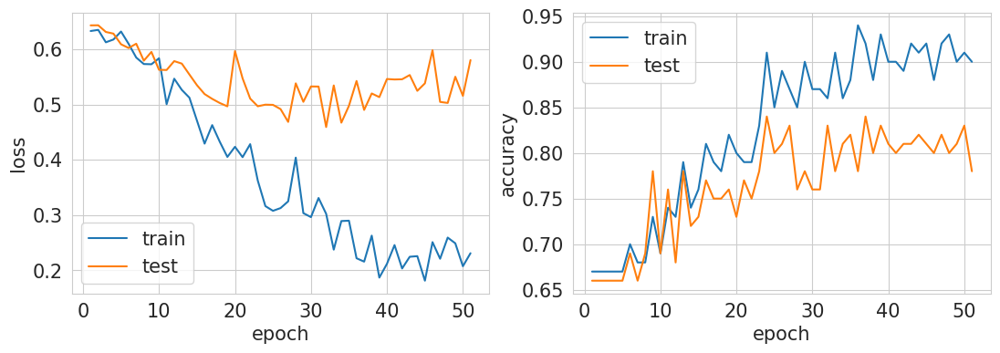


 51%|████████████████████████████████████████████████████████████████████████████████████████▏                                                                                    | 51/100 [00:48<00:44,  1.09it/s]

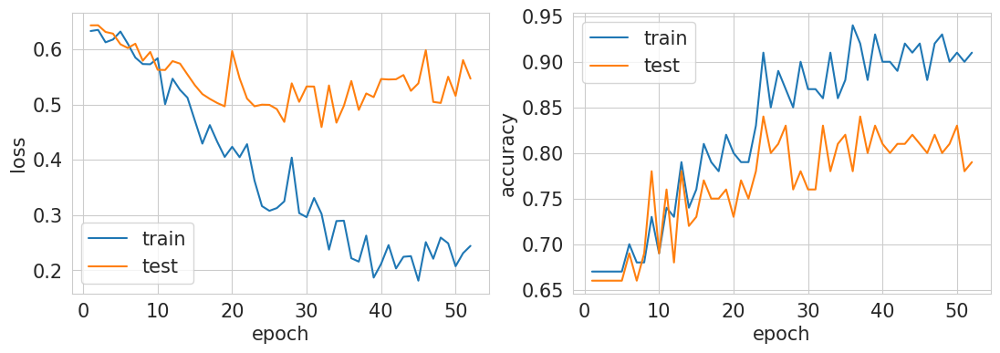


 52%|█████████████████████████████████████████████████████████████████████████████████████████▉                                                                                   | 52/100 [00:49<00:44,  1.09it/s]

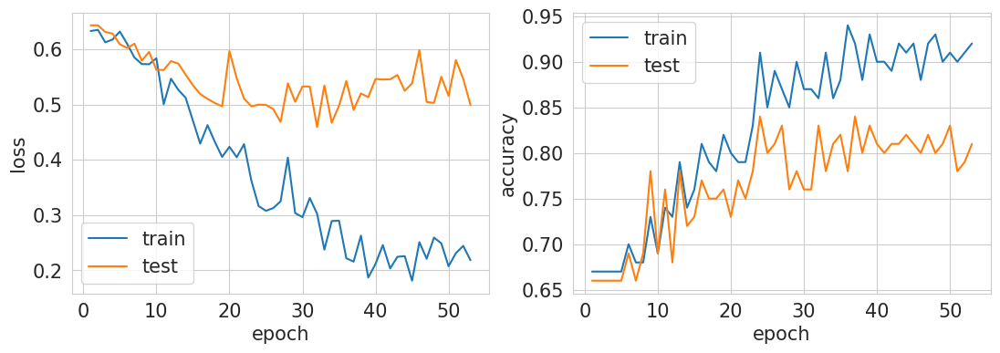


 53%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 53/100 [00:50<00:44,  1.06it/s]

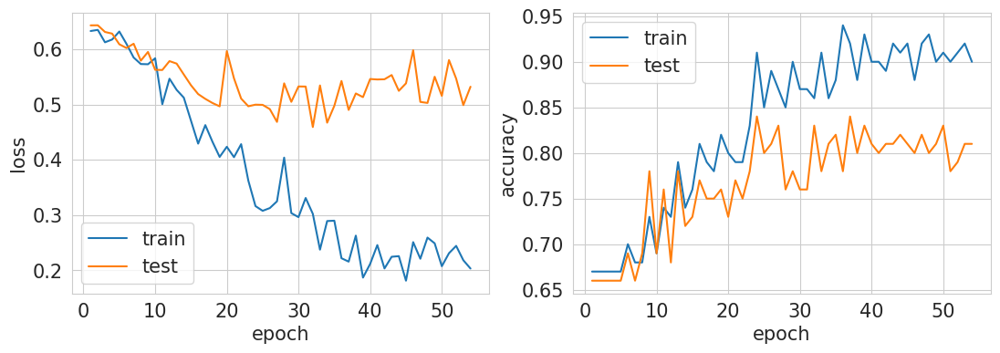


 54%|█████████████████████████████████████████████████████████████████████████████████████████████▍                                                                               | 54/100 [00:51<00:44,  1.02it/s]

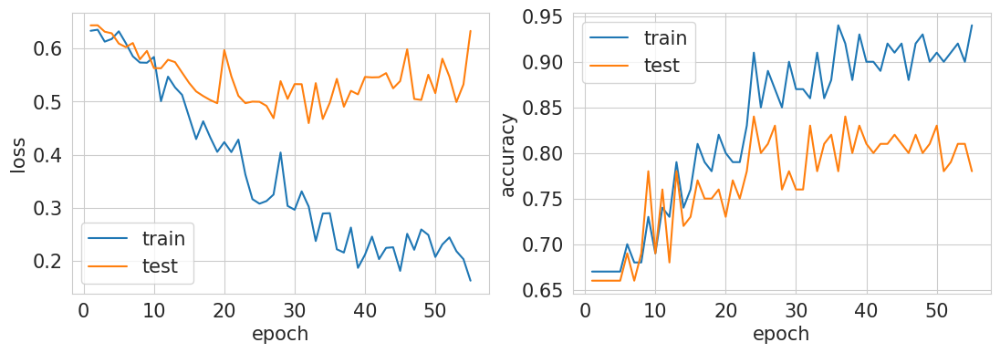


 55%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 55/100 [00:51<00:43,  1.04it/s]

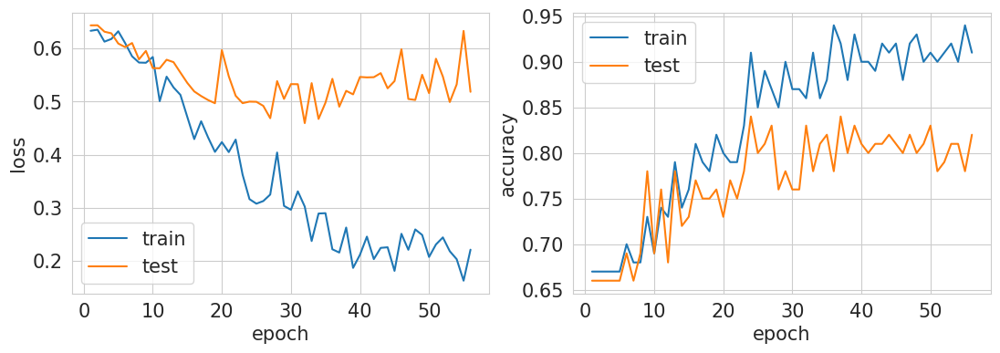


 56%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 56/100 [00:52<00:41,  1.07it/s]

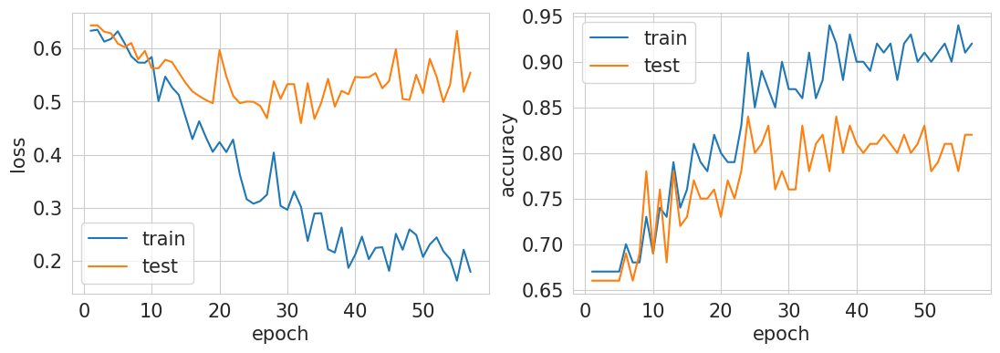


 57%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                          | 57/100 [00:53<00:39,  1.09it/s]

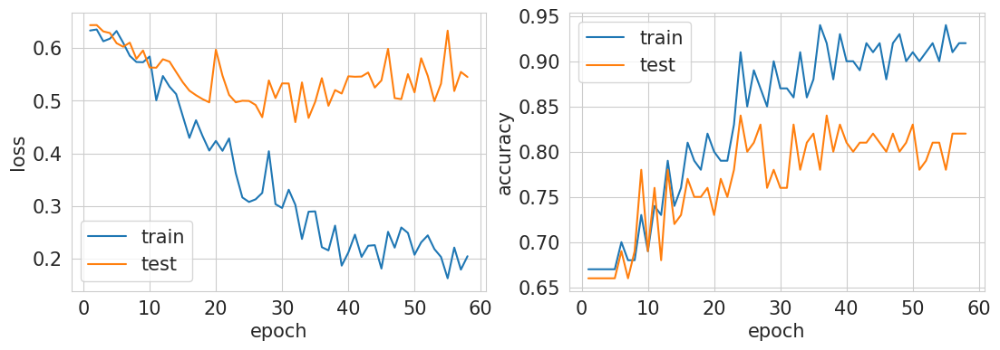


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 58/100 [00:54<00:37,  1.11it/s]

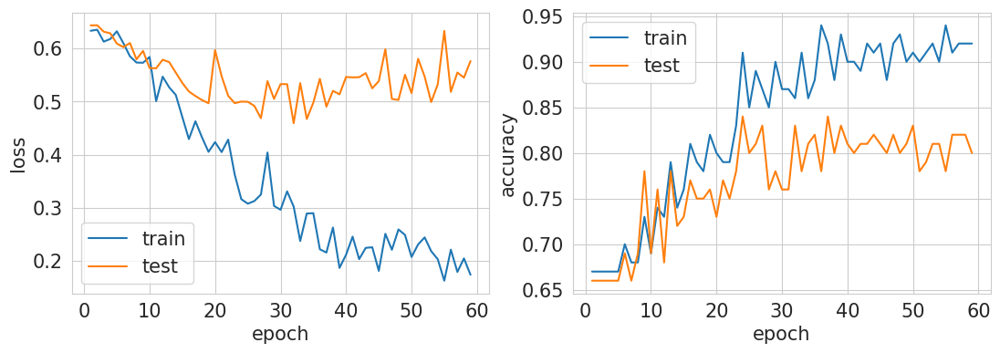


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 59/100 [00:55<00:39,  1.05it/s]

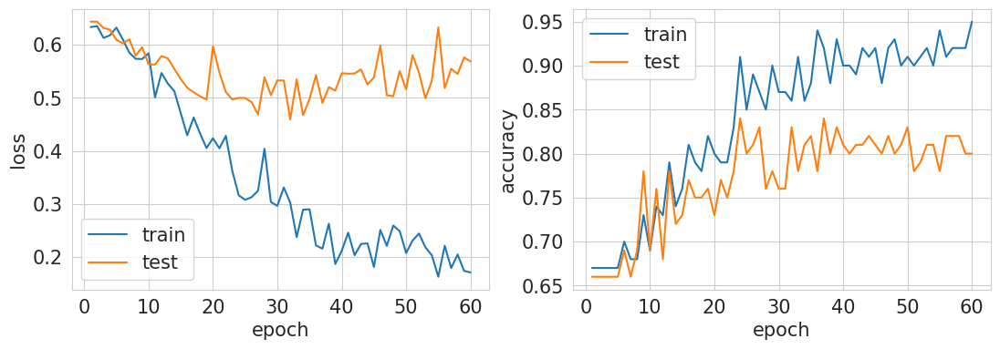


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 60/100 [00:56<00:38,  1.05it/s]

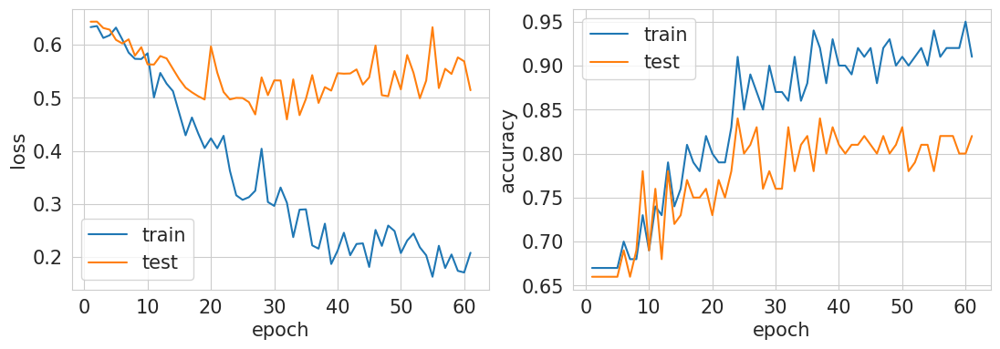


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 61/100 [00:57<00:37,  1.05it/s]

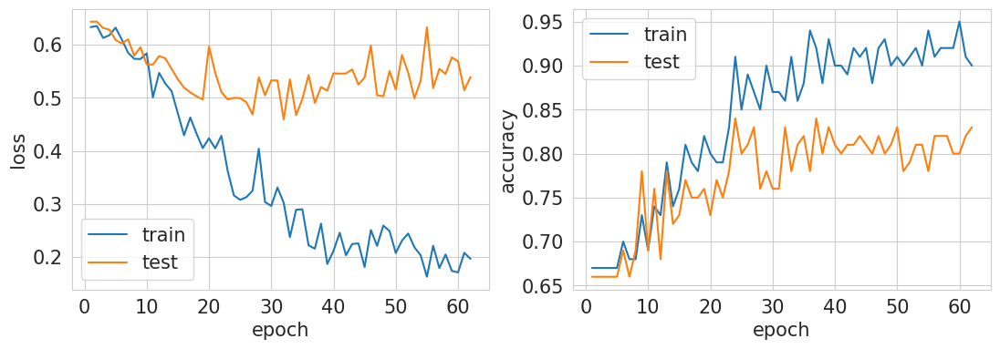


 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                 | 62/100 [00:58<00:36,  1.05it/s]

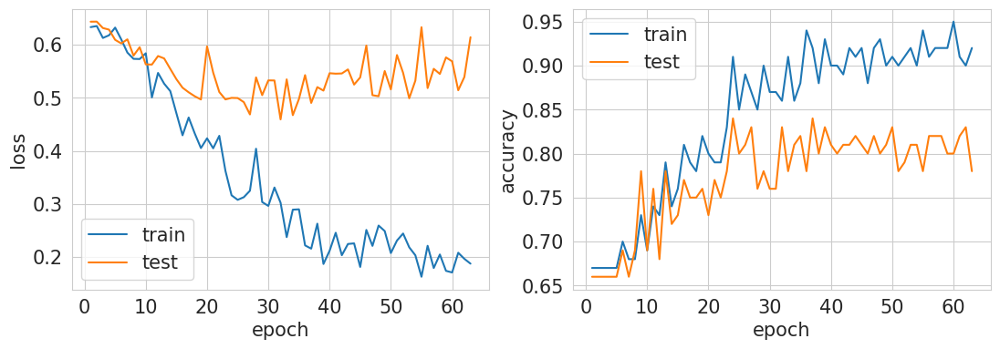


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 63/100 [00:59<00:35,  1.05it/s]

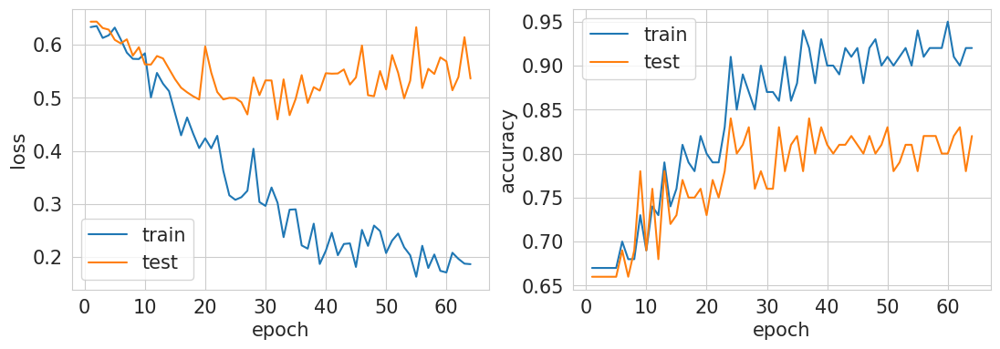


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 64/100 [01:00<00:34,  1.05it/s]

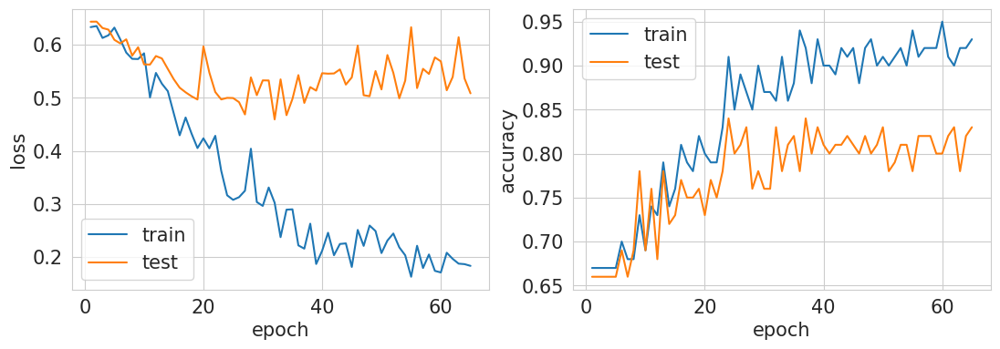


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 65/100 [01:01<00:32,  1.09it/s]

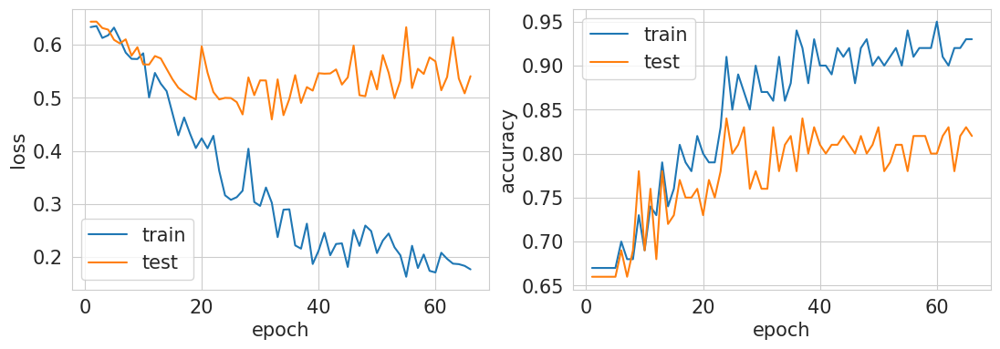


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 66/100 [01:02<00:30,  1.12it/s]

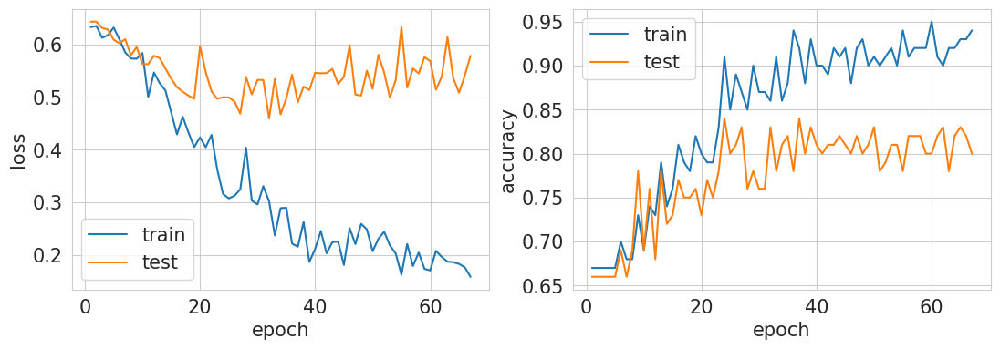


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 67/100 [01:02<00:29,  1.14it/s]

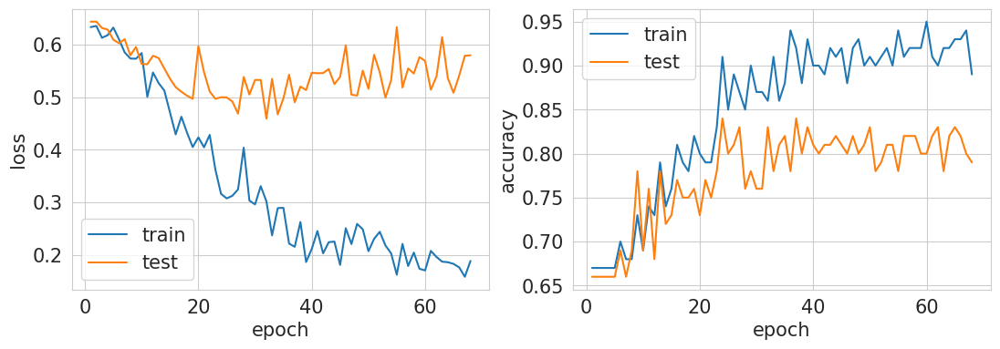


 68%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 68/100 [01:03<00:27,  1.14it/s]

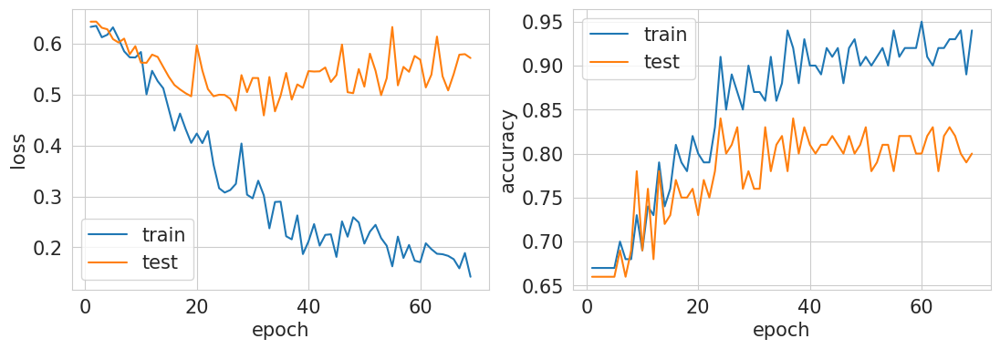


 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 69/100 [01:04<00:27,  1.13it/s]

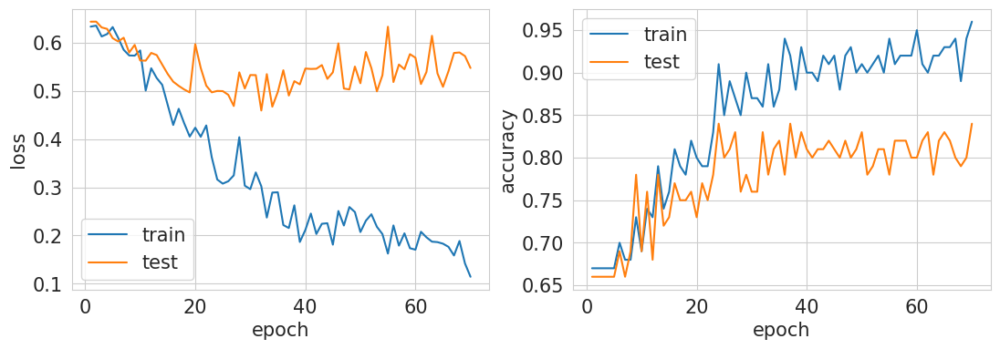


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 70/100 [01:05<00:27,  1.11it/s]

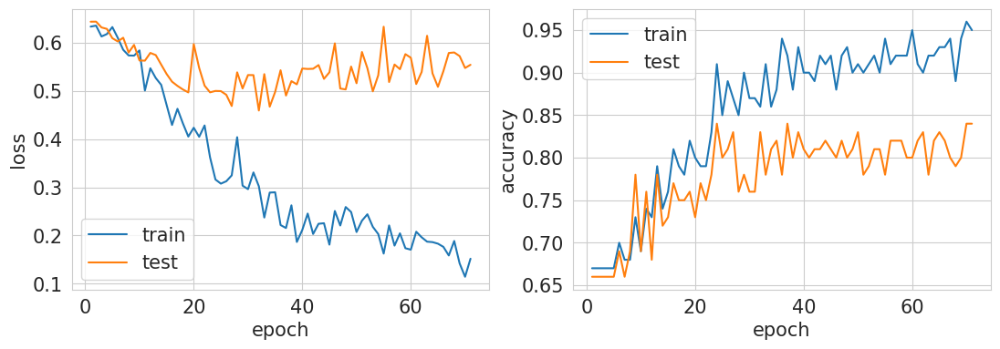


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 71/100 [01:06<00:27,  1.07it/s]

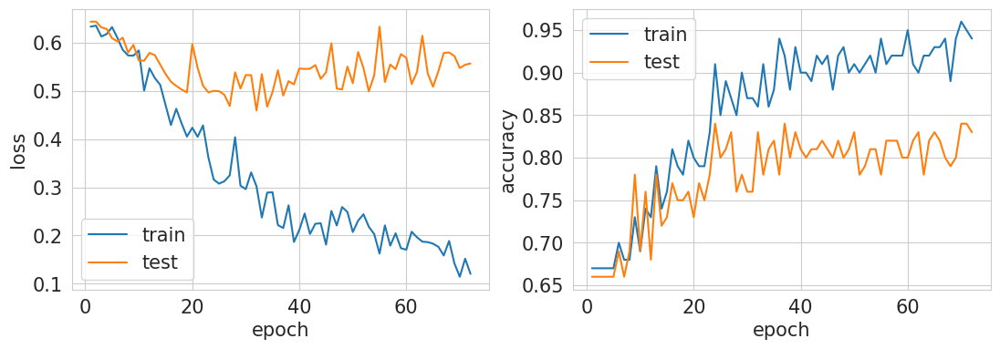


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 72/100 [01:07<00:25,  1.09it/s]

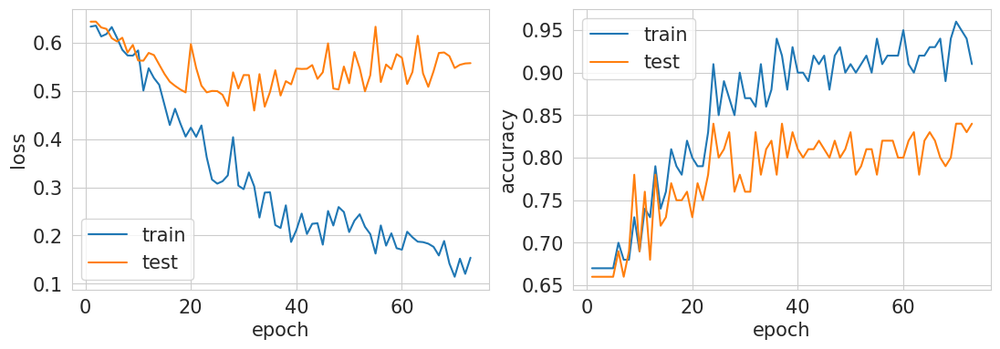


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                              | 73/100 [01:08<00:25,  1.04it/s]

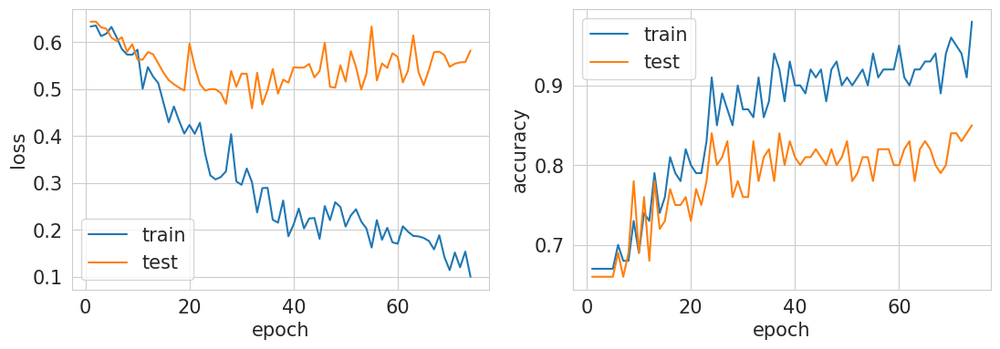


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 74/100 [01:09<00:24,  1.06it/s]

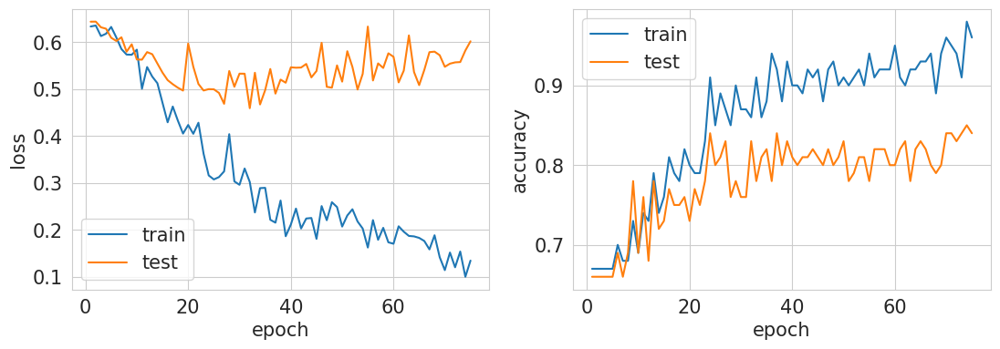


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                           | 75/100 [01:10<00:23,  1.07it/s]

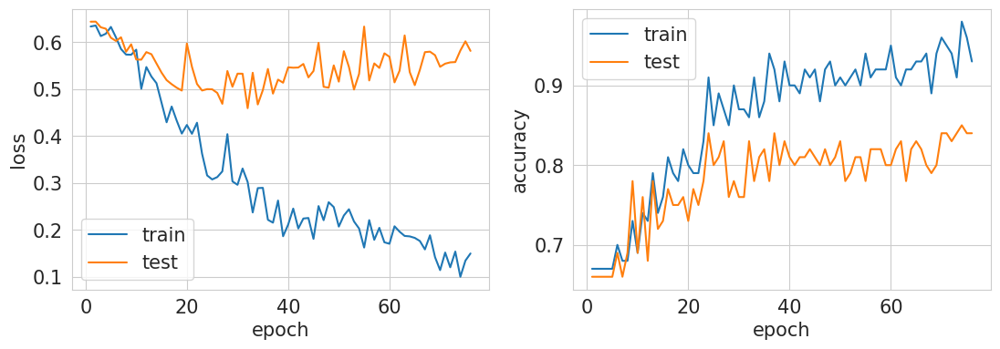


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 76/100 [01:11<00:22,  1.09it/s]

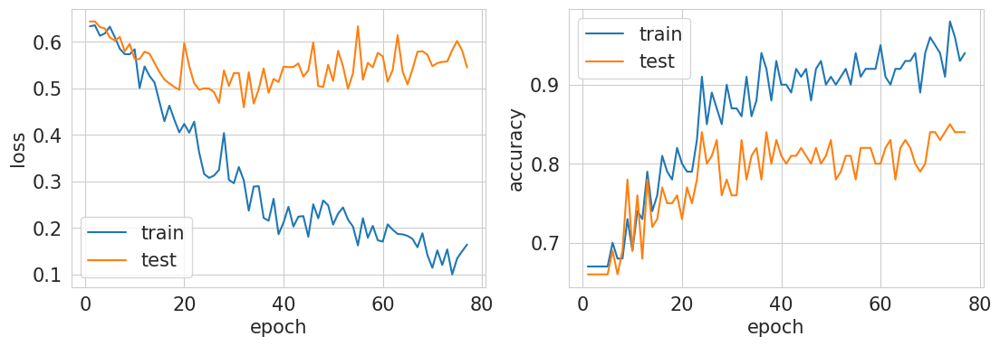


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 77/100 [01:12<00:20,  1.10it/s]

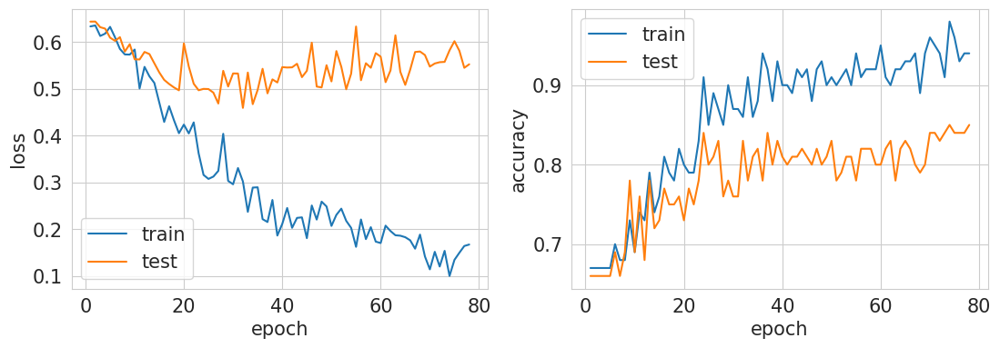


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 78/100 [01:13<00:20,  1.07it/s]

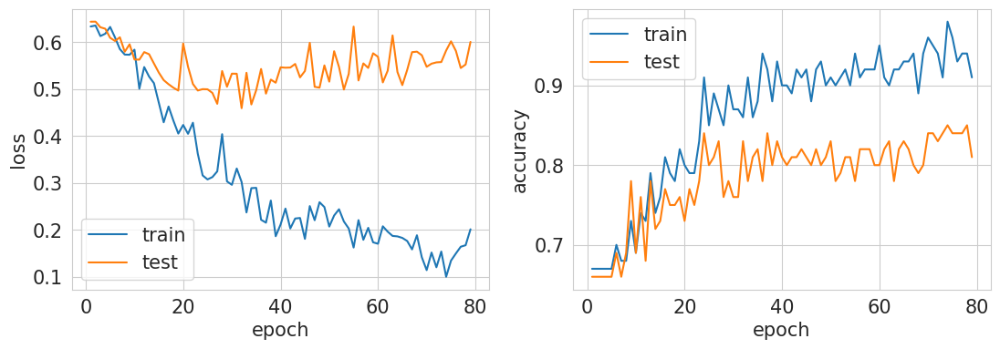


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                    | 79/100 [01:14<00:19,  1.08it/s]

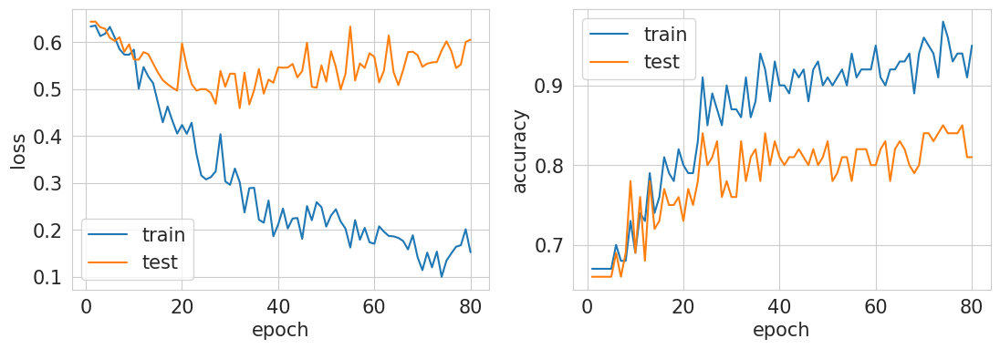


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 80/100 [01:15<00:18,  1.10it/s]

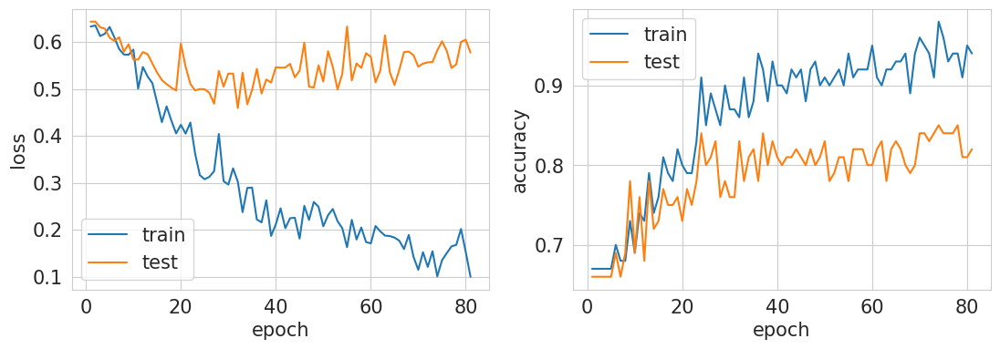


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                | 81/100 [01:15<00:17,  1.08it/s]

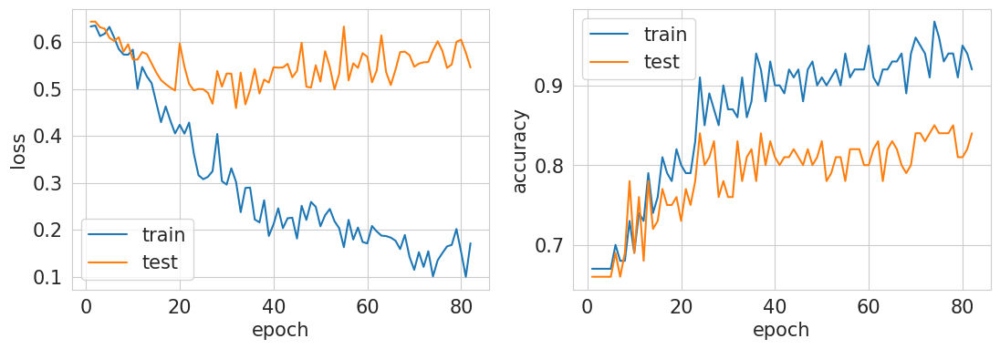


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 82/100 [01:17<00:17,  1.04it/s]

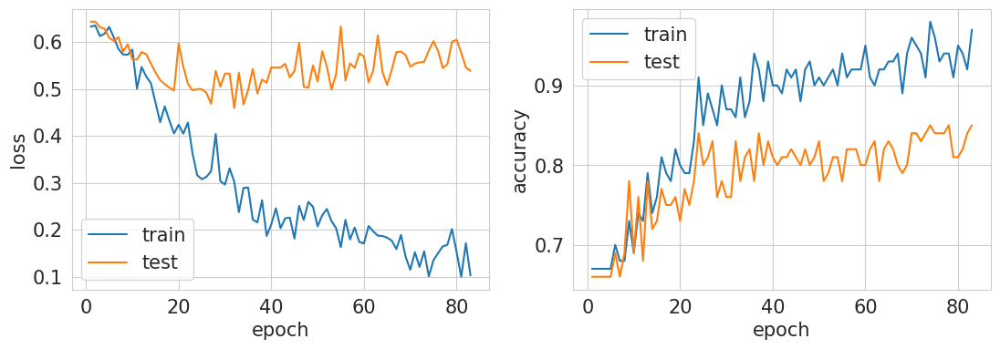


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                             | 83/100 [01:17<00:15,  1.08it/s]

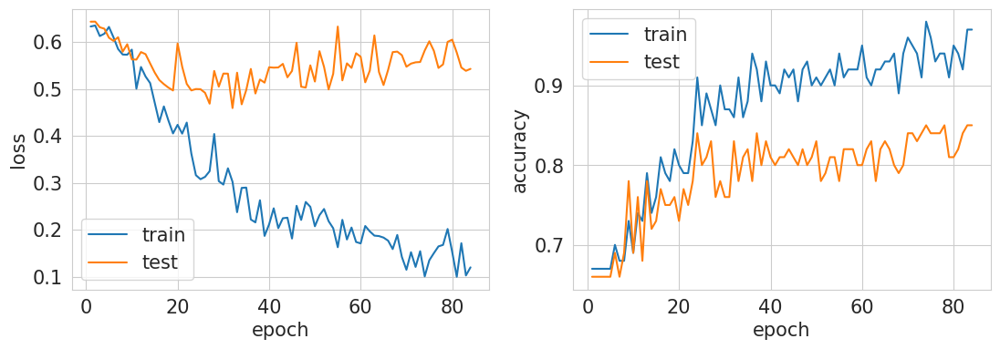


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                           | 84/100 [01:18<00:14,  1.10it/s]

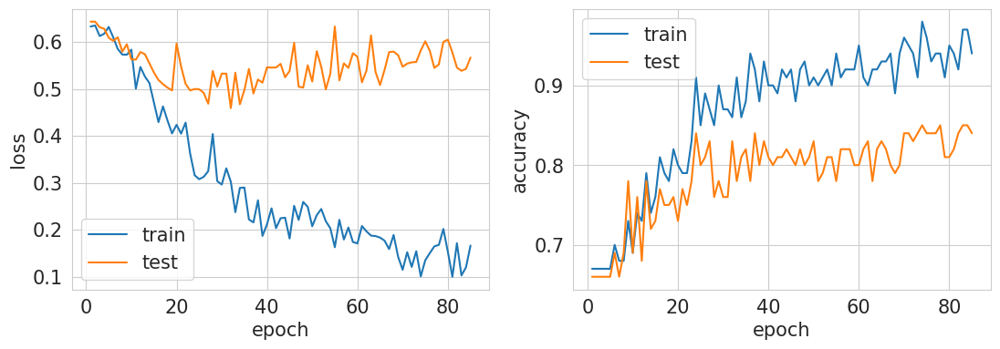


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 85/100 [01:19<00:13,  1.09it/s]

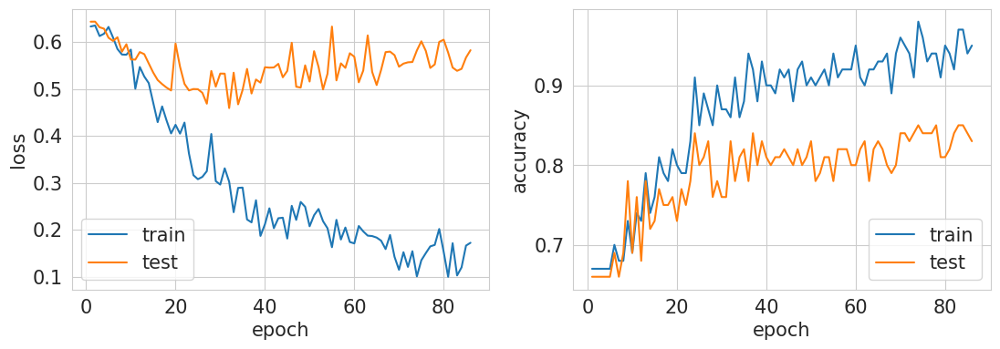


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 86/100 [01:20<00:13,  1.04it/s]

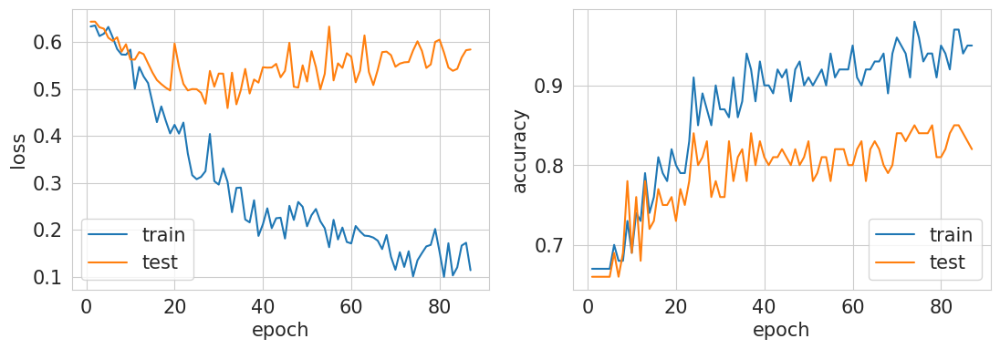


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                      | 87/100 [01:21<00:12,  1.06it/s]

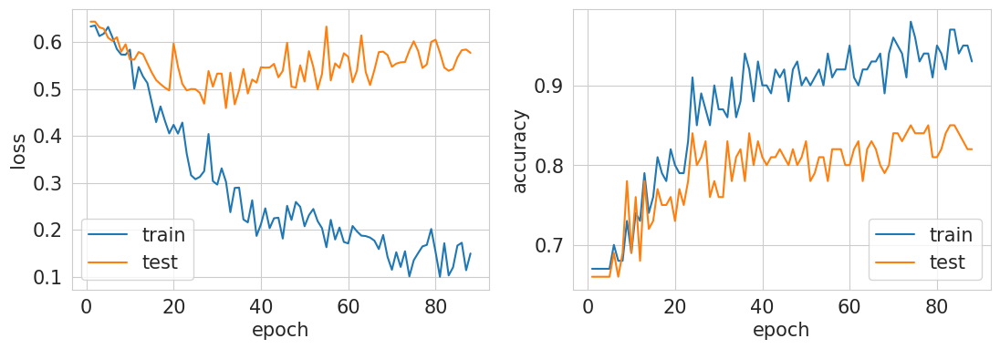


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 88/100 [01:22<00:11,  1.07it/s]

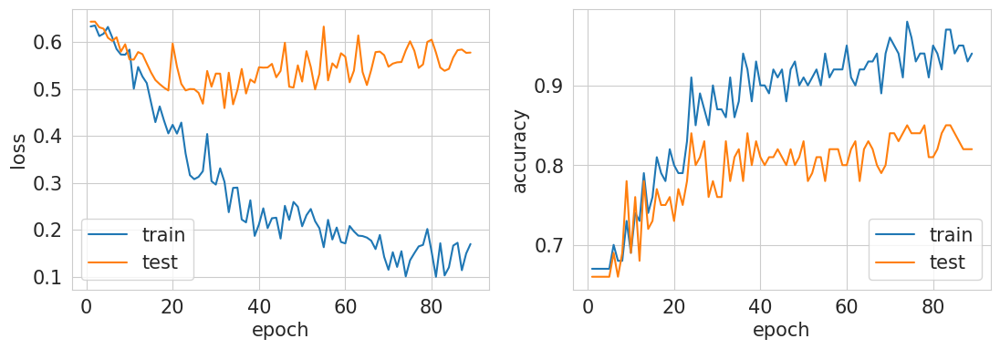


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 89/100 [01:23<00:10,  1.09it/s]

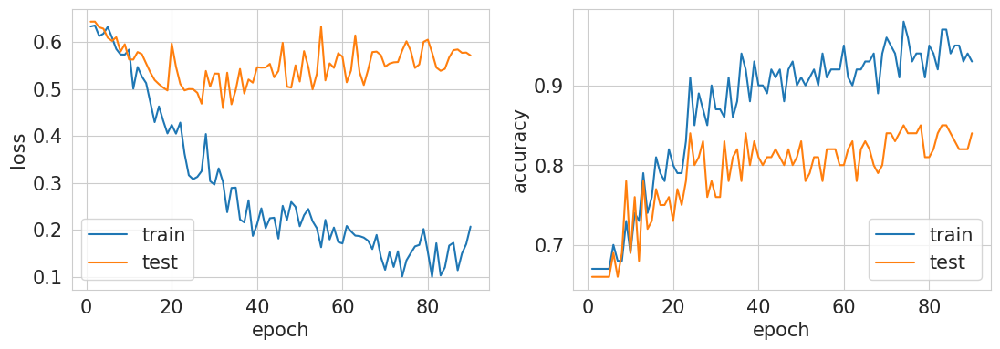


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 90/100 [01:24<00:08,  1.12it/s]

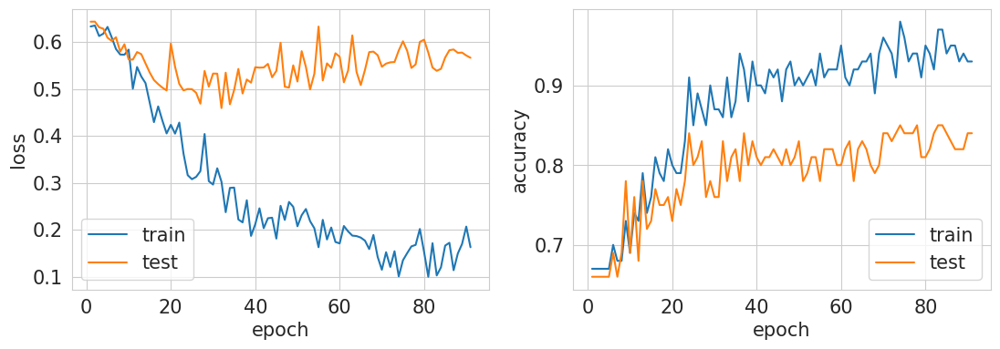


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 91/100 [01:25<00:07,  1.14it/s]

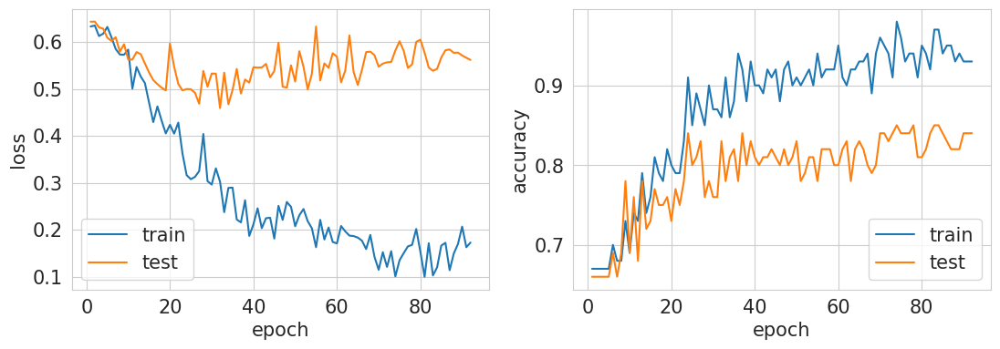


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 92/100 [01:25<00:07,  1.13it/s]

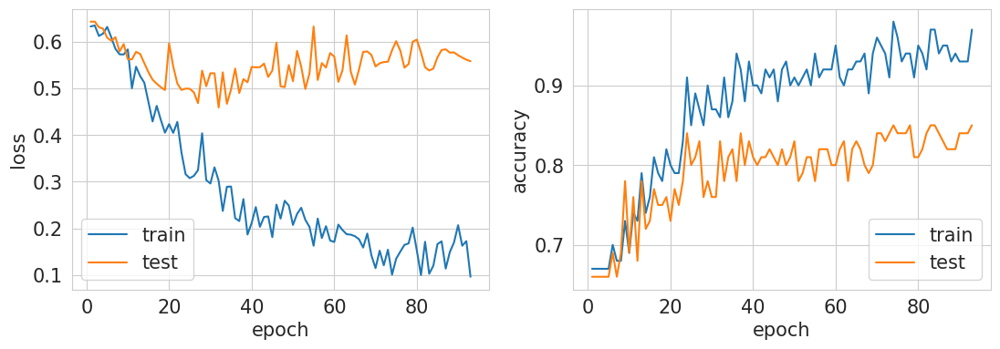


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 93/100 [01:26<00:06,  1.15it/s]

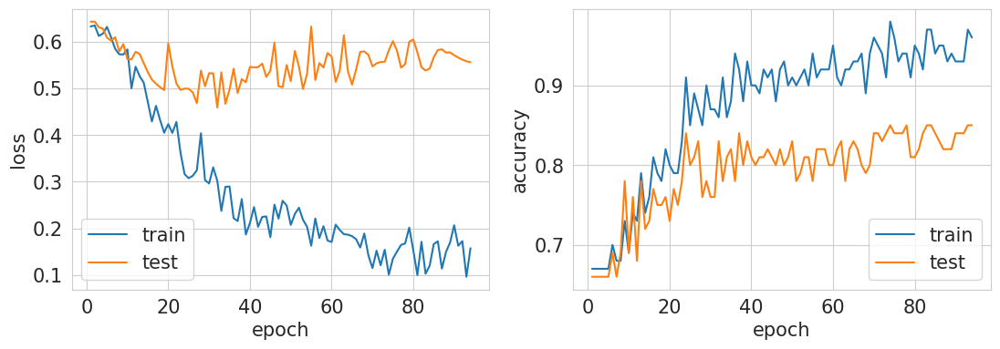


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 94/100 [01:27<00:05,  1.15it/s]

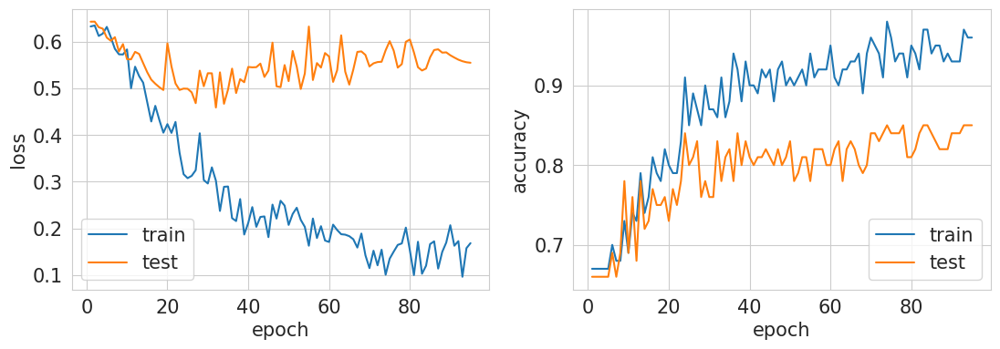


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 95/100 [01:28<00:04,  1.14it/s]

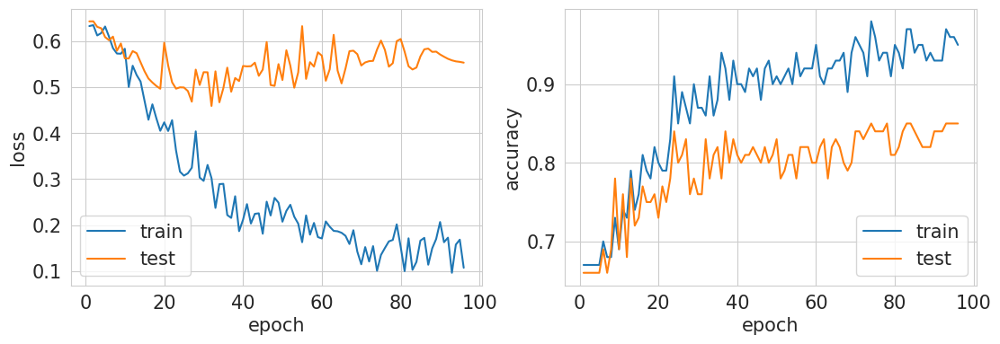


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 96/100 [01:29<00:03,  1.14it/s]

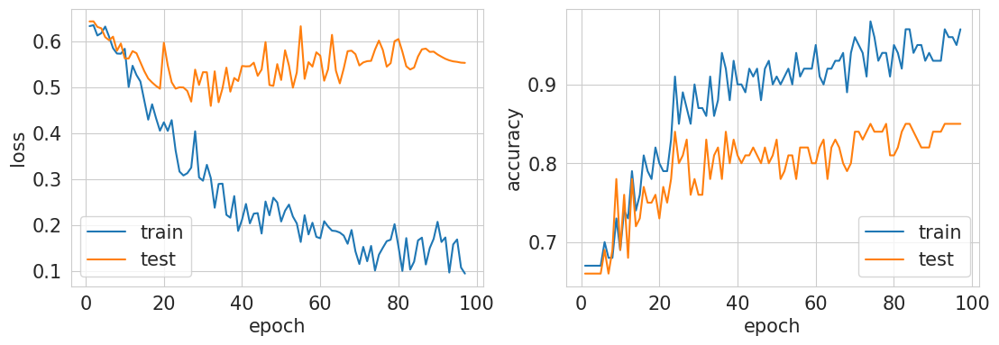


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 97/100 [01:30<00:02,  1.11it/s]

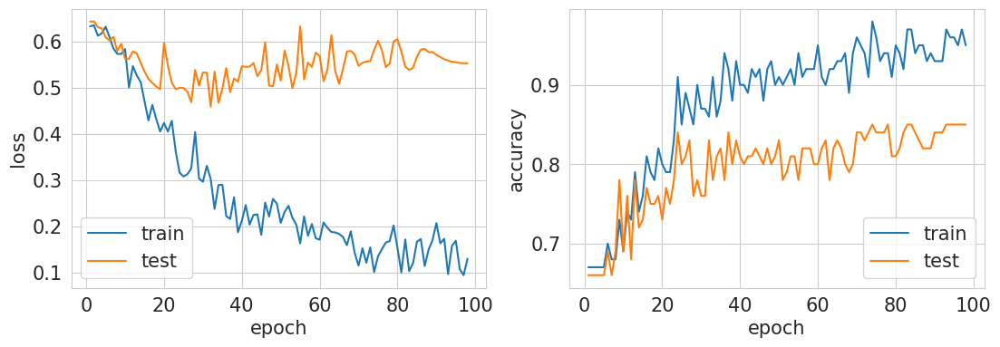


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 98/100 [01:31<00:01,  1.10it/s]

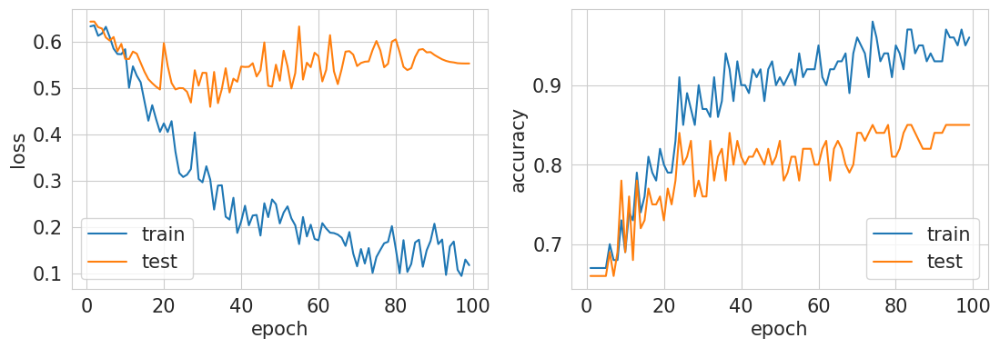


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 99/100 [01:32<00:00,  1.09it/s]

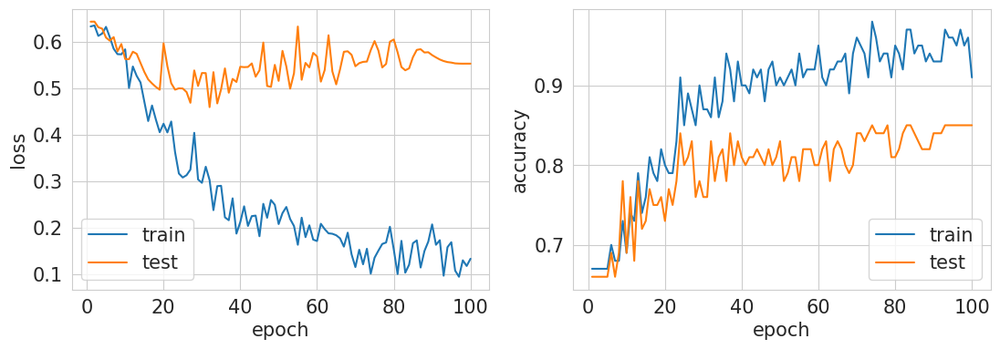


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:33<00:00,  1.07it/s]

  0%|                                                                                                                                                                                      | 0/100 [00:00<?, ?it/s]

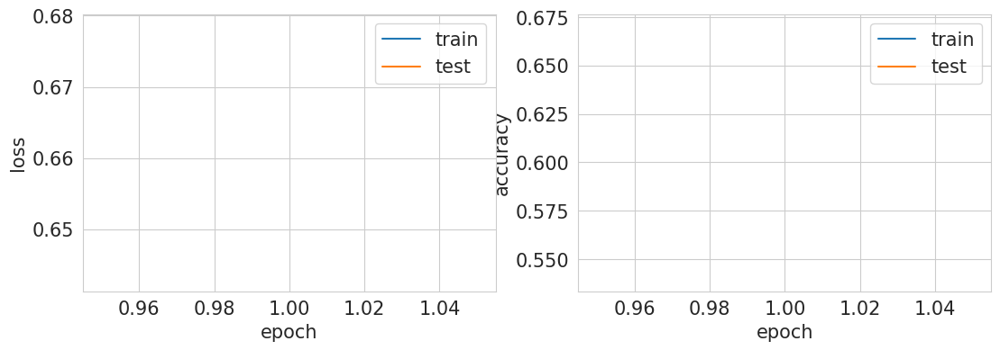


  1%|█▋                                                                                                                                                                            | 1/100 [00:01<01:44,  1.06s/it]

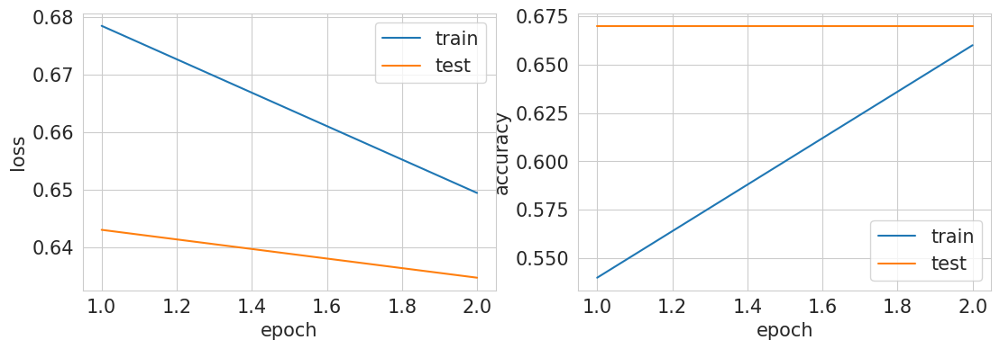


  2%|███▍                                                                                                                                                                          | 2/100 [00:01<01:34,  1.04it/s]

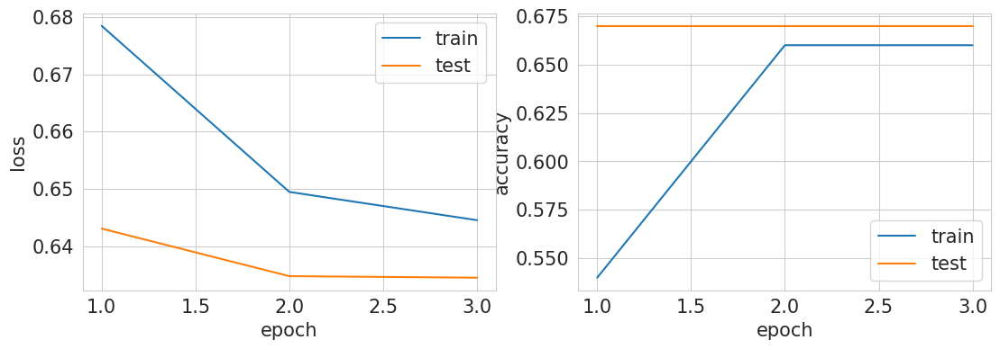


  3%|█████▏                                                                                                                                                                        | 3/100 [00:02<01:31,  1.06it/s]

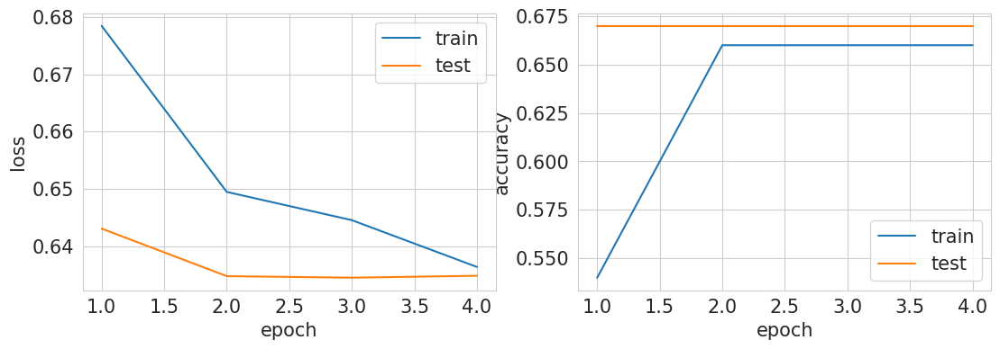


  4%|██████▉                                                                                                                                                                       | 4/100 [00:03<01:31,  1.05it/s]

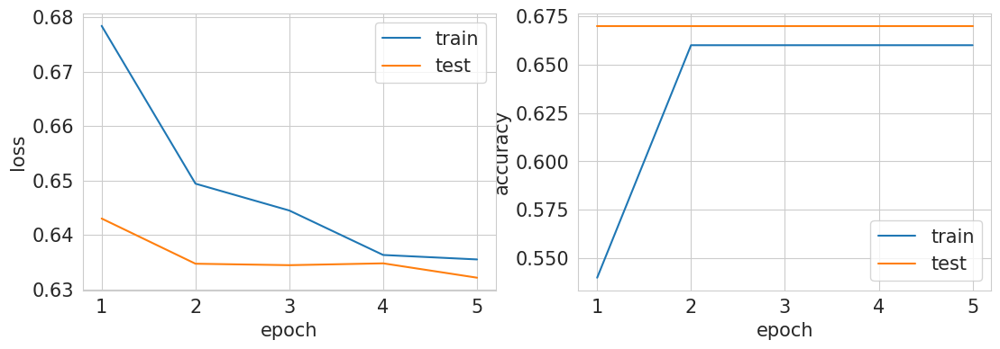


  5%|████████▋                                                                                                                                                                     | 5/100 [00:04<01:27,  1.08it/s]

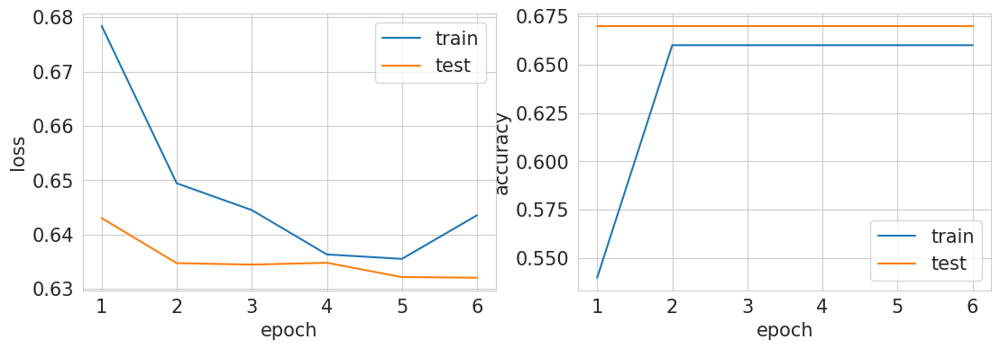


  6%|██████████▍                                                                                                                                                                   | 6/100 [00:05<01:25,  1.10it/s]

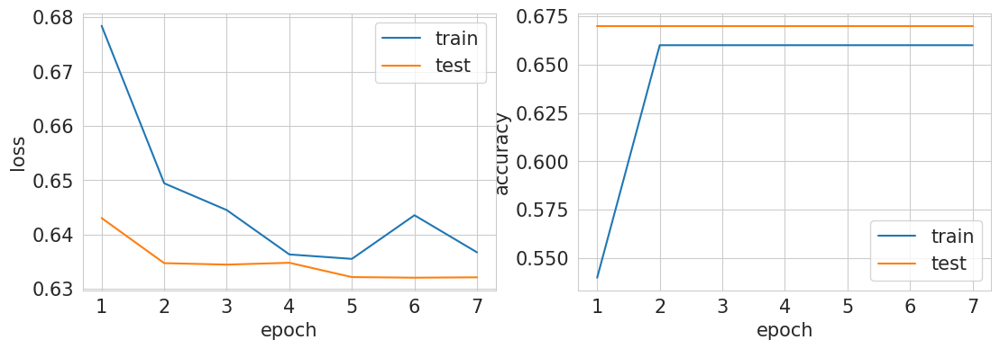


  7%|████████████▏                                                                                                                                                                 | 7/100 [00:06<01:25,  1.09it/s]

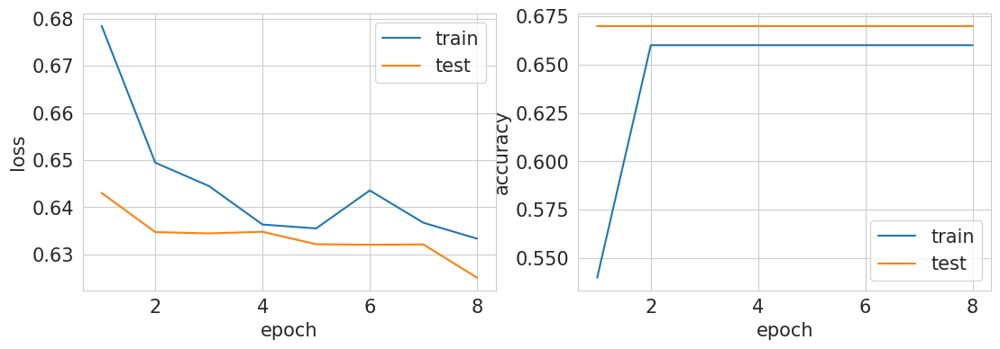


  8%|█████████████▉                                                                                                                                                                | 8/100 [00:07<01:21,  1.12it/s]

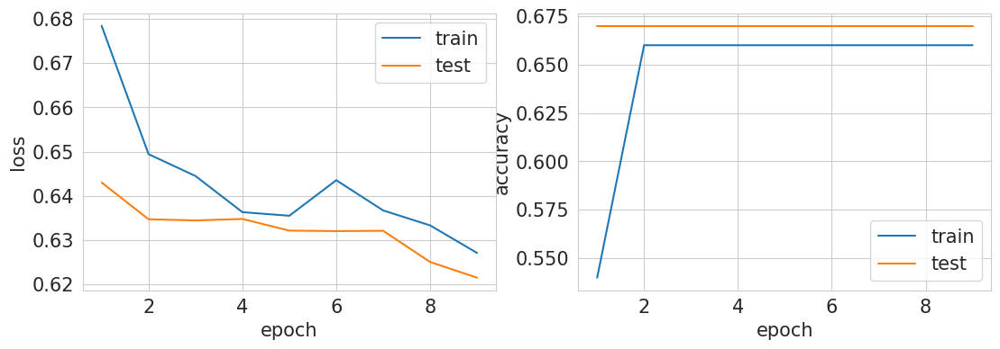


  9%|███████████████▋                                                                                                                                                              | 9/100 [00:08<01:19,  1.15it/s]

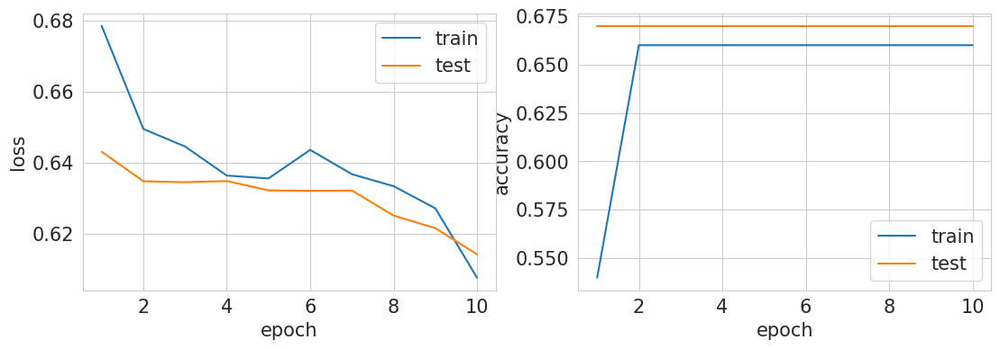


 10%|█████████████████▎                                                                                                                                                           | 10/100 [00:09<01:17,  1.16it/s]

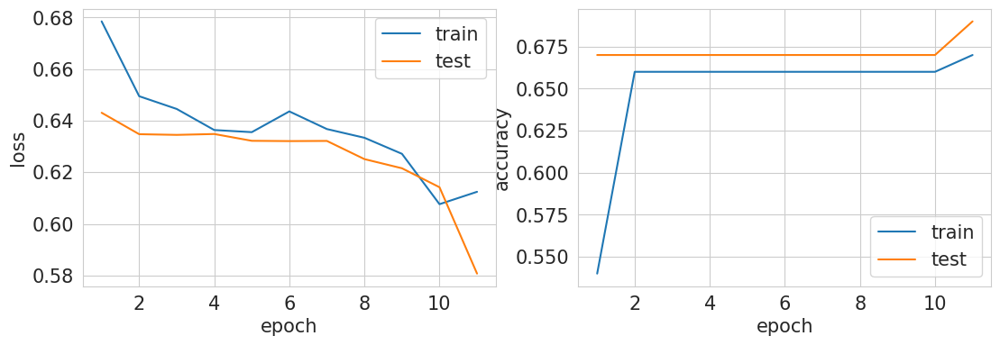


 11%|███████████████████                                                                                                                                                          | 11/100 [00:09<01:15,  1.17it/s]

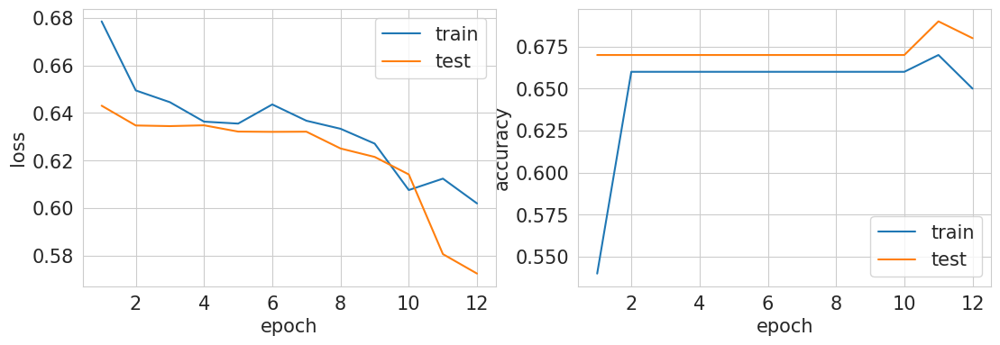


 12%|████████████████████▊                                                                                                                                                        | 12/100 [00:10<01:14,  1.17it/s]

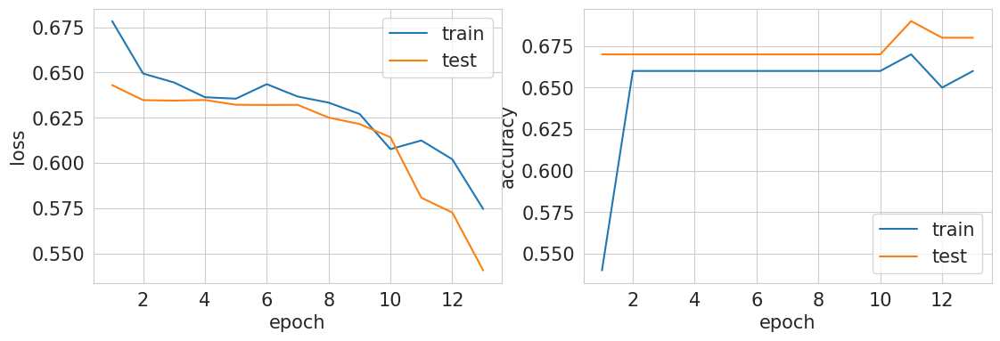


 13%|██████████████████████▍                                                                                                                                                      | 13/100 [00:11<01:18,  1.10it/s]

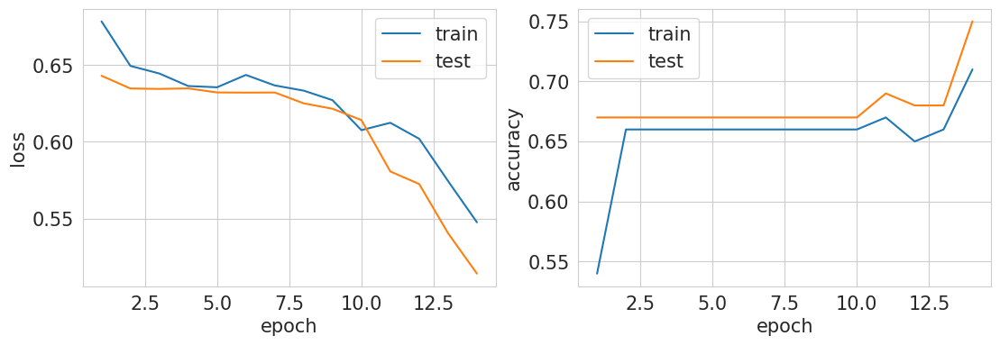


 14%|████████████████████████▏                                                                                                                                                    | 14/100 [00:12<01:15,  1.14it/s]

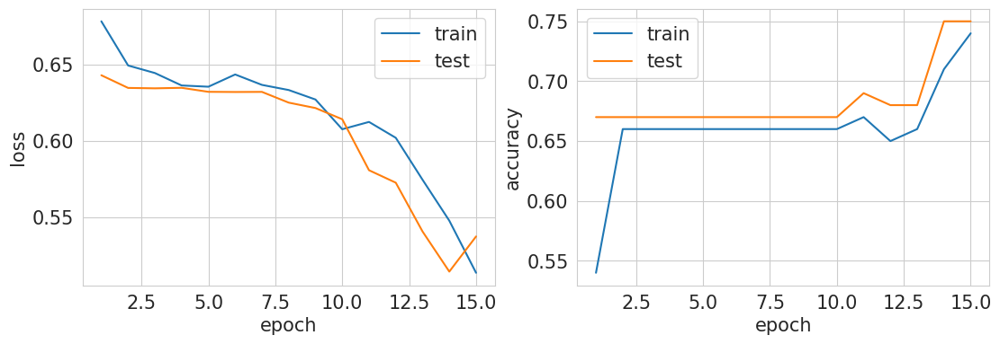


 15%|█████████████████████████▉                                                                                                                                                   | 15/100 [00:13<01:13,  1.16it/s]

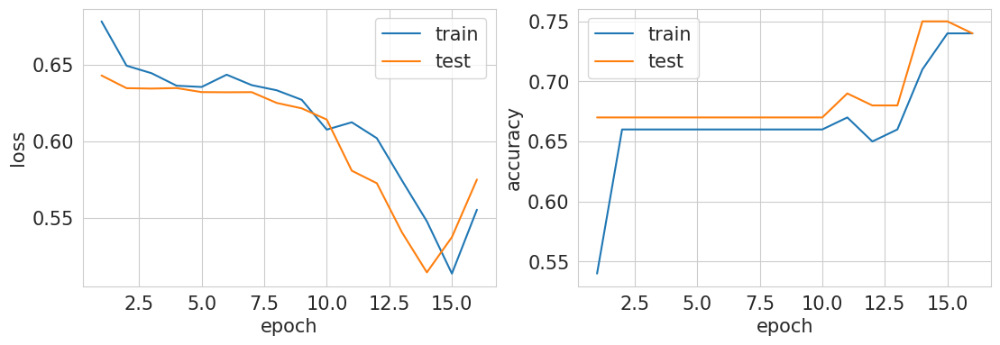


 16%|███████████████████████████▋                                                                                                                                                 | 16/100 [00:14<01:11,  1.17it/s]

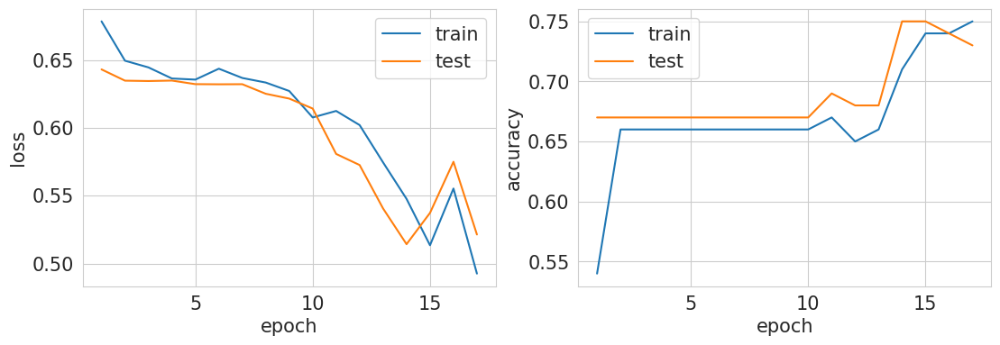


 17%|█████████████████████████████▍                                                                                                                                               | 17/100 [00:15<01:09,  1.20it/s]

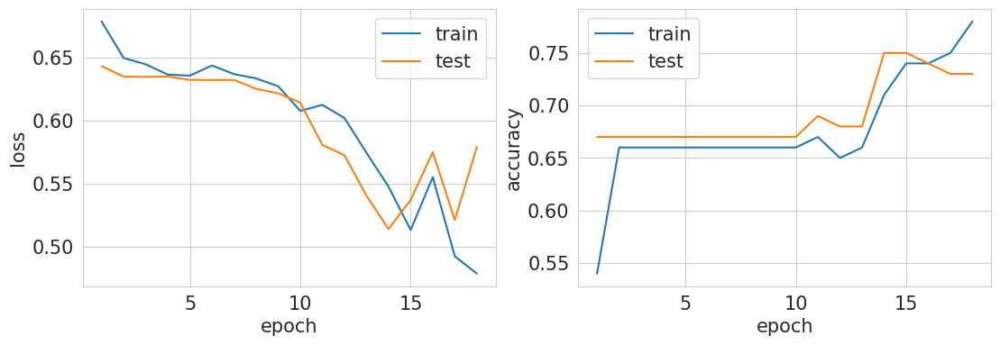


 18%|███████████████████████████████▏                                                                                                                                             | 18/100 [00:15<01:07,  1.22it/s]

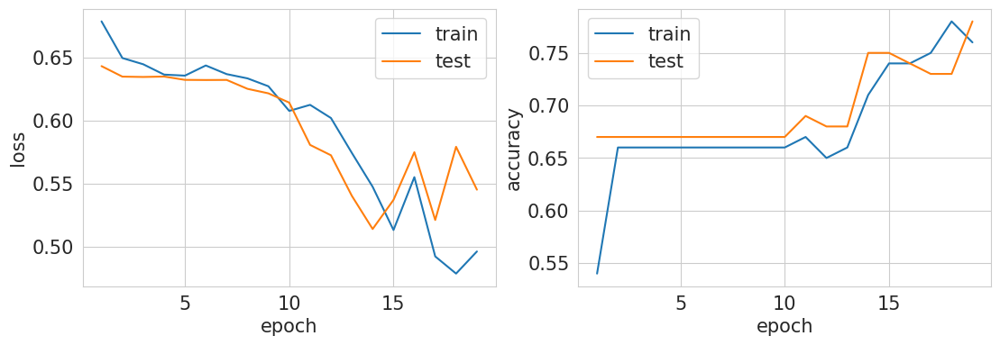


 19%|████████████████████████████████▊                                                                                                                                            | 19/100 [00:16<01:06,  1.22it/s]

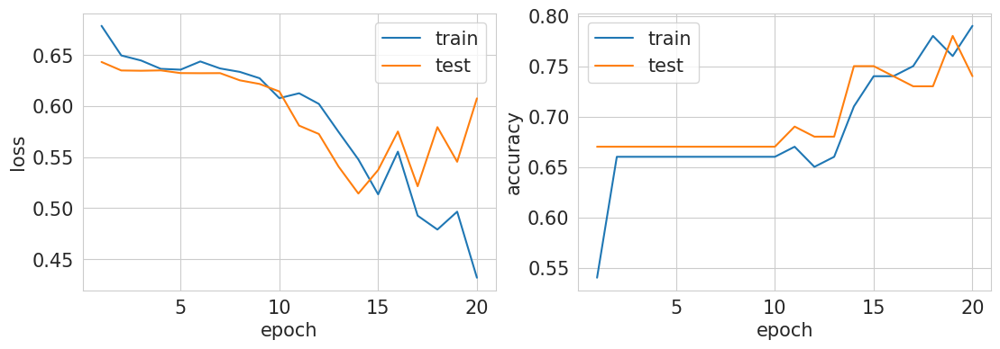


 20%|██████████████████████████████████▌                                                                                                                                          | 20/100 [00:17<01:05,  1.22it/s]

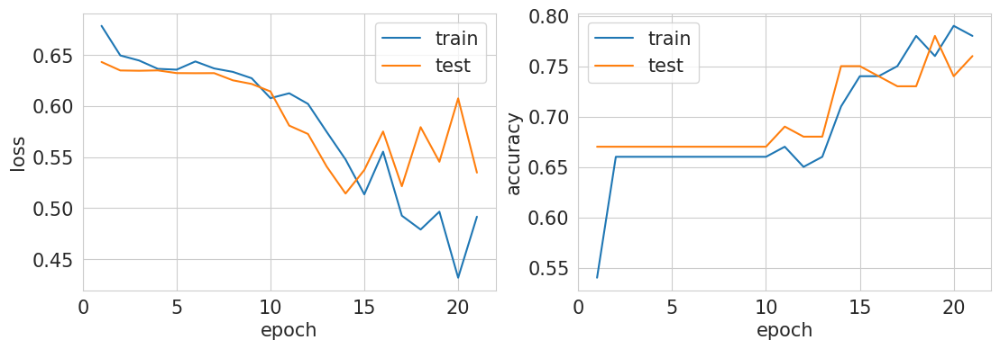


 21%|████████████████████████████████████▎                                                                                                                                        | 21/100 [00:18<01:04,  1.22it/s]

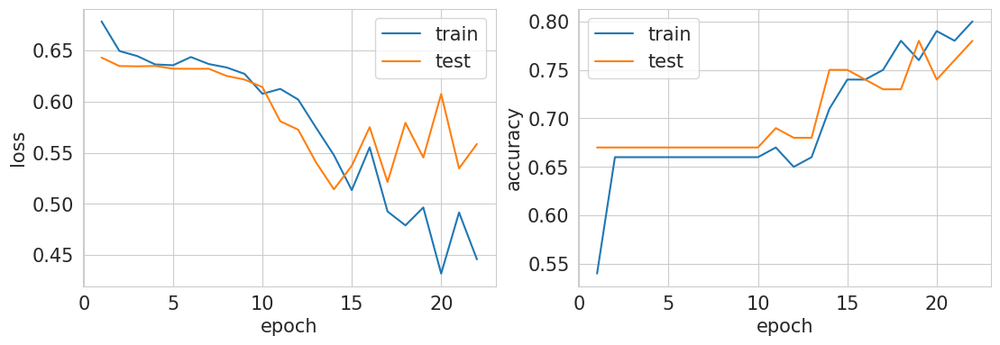


 22%|██████████████████████████████████████                                                                                                                                       | 22/100 [00:19<01:04,  1.21it/s]

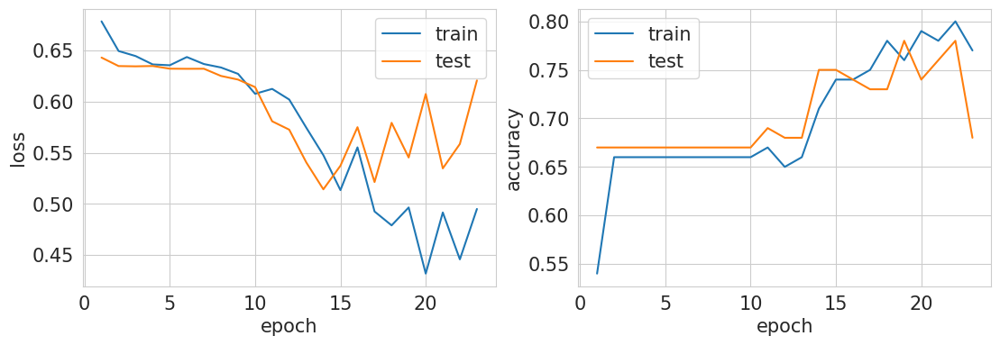


 23%|███████████████████████████████████████▊                                                                                                                                     | 23/100 [00:19<01:04,  1.20it/s]

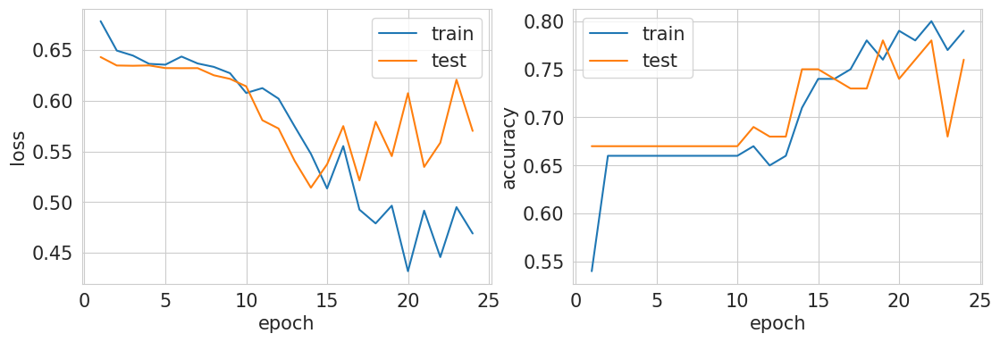


 24%|█████████████████████████████████████████▌                                                                                                                                   | 24/100 [00:20<01:06,  1.15it/s]

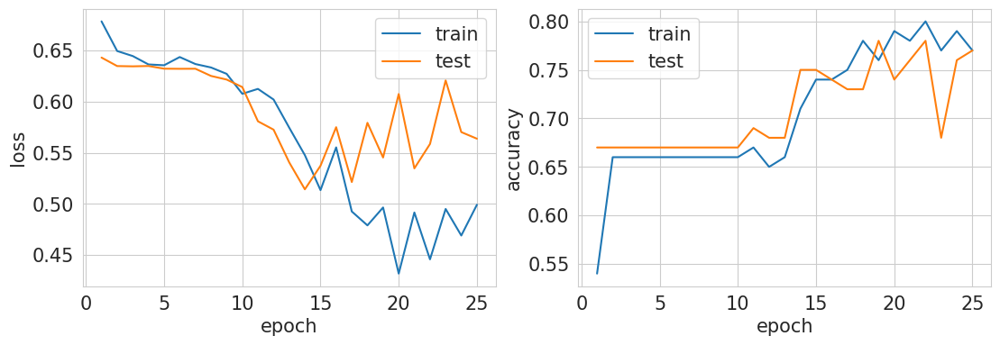


 25%|███████████████████████████████████████████▎                                                                                                                                 | 25/100 [00:21<01:04,  1.15it/s]

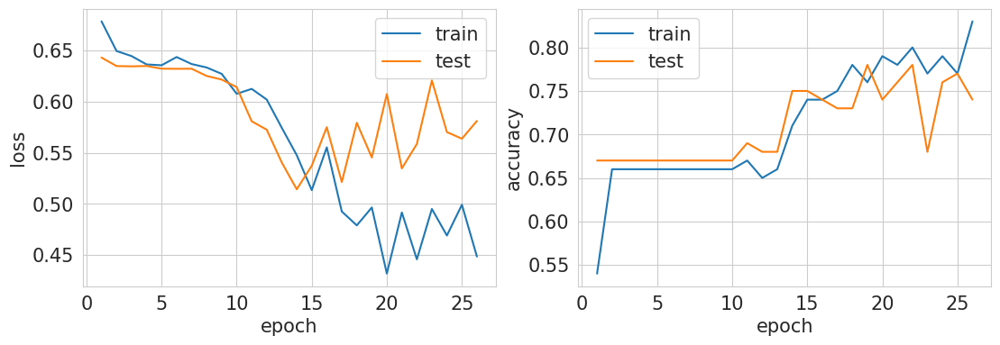


 26%|████████████████████████████████████████████▉                                                                                                                                | 26/100 [00:22<01:04,  1.15it/s]

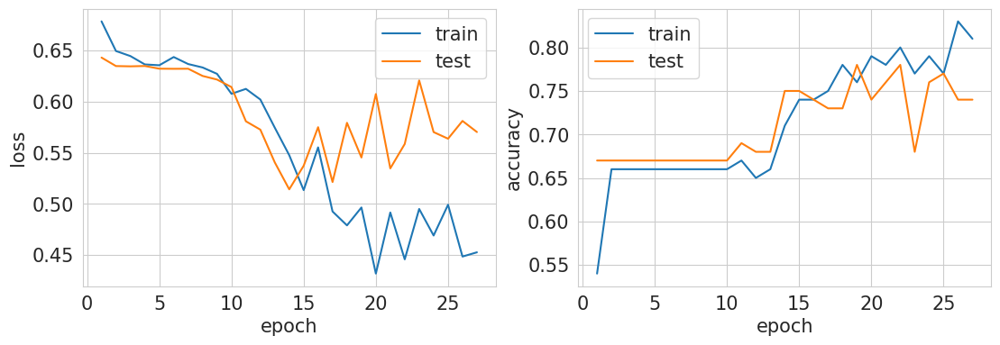


 27%|██████████████████████████████████████████████▋                                                                                                                              | 27/100 [00:23<01:03,  1.14it/s]

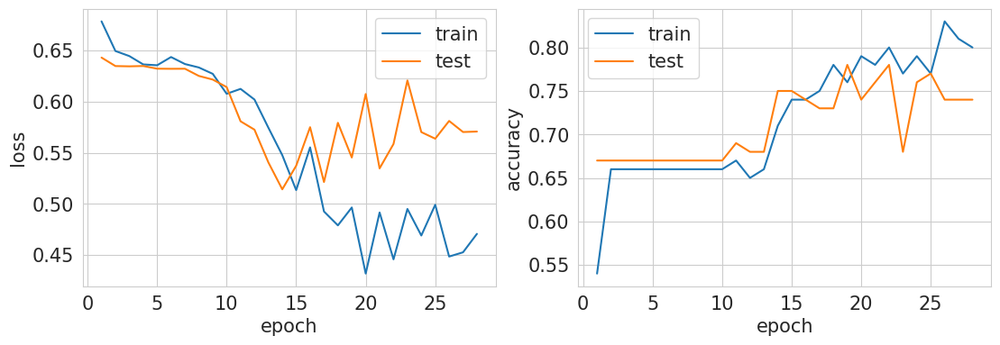


 28%|████████████████████████████████████████████████▍                                                                                                                            | 28/100 [00:24<01:09,  1.04it/s]

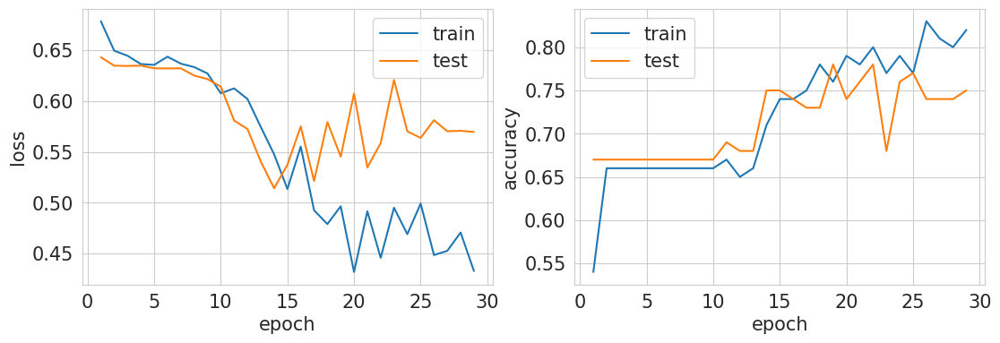


 29%|██████████████████████████████████████████████████▏                                                                                                                          | 29/100 [00:25<01:08,  1.04it/s]

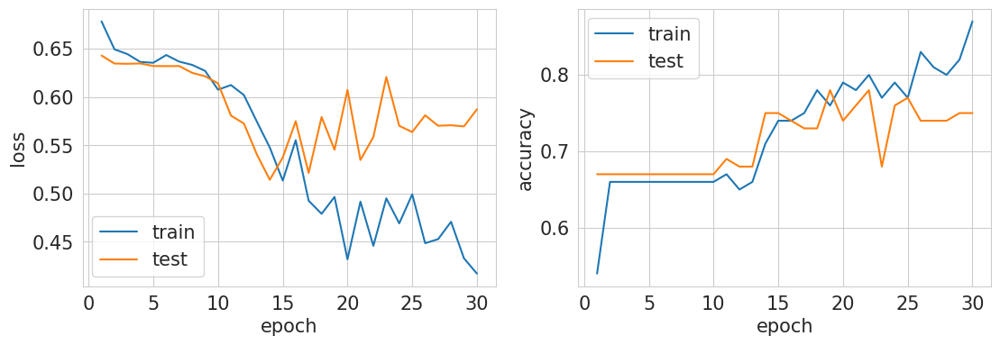


 30%|███████████████████████████████████████████████████▉                                                                                                                         | 30/100 [00:26<01:08,  1.03it/s]

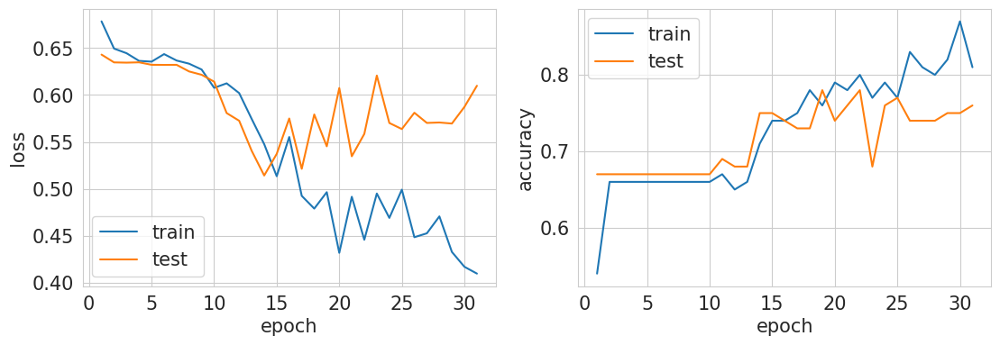


  0%|                                                                                                                                                                                        | 0/2 [02:01<?, ?it/s]


KeyboardInterrupt: 

In [19]:
n_classes = 2
seq_len = 96
pseq_len = seq_len
max_len = pseq_len // 2
d_model = 16
num_heads = 2
d_hid = 64
nlayers = 2
dropout = 0.2

ret = score(X, y,
            lambda: TSPCwLSTM(n_classes=2, preprocessor=SimpleConv(),
                                            chains=[TSChain(pseq_len,
                                                            d_model,
                                                            tokenizer=TSPersistenceTokenizer(max_len),
                                                            transformer=TransformerEncoder(d_model, d_hid, num_heads, dropout, nlayers),
                                                            aggregator=MaskedMean(),
                                                            dropout=dropout,
                                                            enable_pos_encoder=True)]),
            train_model, n_repeats=2, n_splits=2)